In [3]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Ellipse
from scipy.stats import norm
from pathlib import Path
from PIL import Image
import os, time

# --- GAUSSSEARCH helpers (copied from gamma-ckl/01_gauss_search.ipynb) ---

def symmetrize(A):
    return 0.5 * (A + A.T)

def bisecting_hyperplane(x_i, x_j):
    diff = x_i - x_j
    nrm = np.linalg.norm(diff)
    if nrm < 1e-12:
        w = np.zeros_like(diff); w[0] = 1.0
        return w, 0.0
    w = diff / nrm
    b = (np.dot(x_j, x_j) - np.dot(x_i, x_i)) / (2 * nrm)
    return w, b

def probit_prob(x_i, x_j, x_t, sigma_eps):
    w, b = bisecting_hyperplane(x_i, x_j)
    return norm.cdf((np.dot(x_t, w) + b) / sigma_eps)

def query_oracle(x_i, x_j, x_t, sigma_eps, rng):
    p = probit_prob(x_i, x_j, x_t, sigma_eps)
    return 0 if rng.random() < p else 1

def sample_mirror(mu, Sigma, X, used, rng):
    Sigma = symmetrize(Sigma)
    eigvals, eigvecs = np.linalg.eigh(Sigma)
    w_star = eigvecs[:, -1]
    b_star = -np.dot(w_star, mu)
    z1 = rng.multivariate_normal(mu, Sigma)
    z2 = z1 - 2 * (np.dot(w_star, z1) + b_star) * w_star
    def nearest(z, exclude):
        diffs = X - z
        d2 = np.einsum('nd,nd->n', diffs, diffs)
        for k in exclude:
            d2[k] = np.inf
        return int(np.argmin(d2))
    i = nearest(z1, used)
    j = nearest(z2, used | {i})
    return i, j

def adf_update(mu, Sigma, x_i, x_j, y, sigma_eps):
    w, b = bisecting_hyperplane(x_i, x_j)
    if y == 1:
        w = -w; b = -b
    Sw = Sigma @ w
    wSw = float(w @ Sw)
    denom = np.sqrt(wSw + sigma_eps**2)
    mu_w = float(mu @ w)
    g = (mu_w + b) / denom
    phi_g = norm.pdf(g)
    Phi_g = max(norm.cdf(g), 1e-12)
    alpha = phi_g / (Phi_g * denom)
    beta = -alpha * (g / denom + alpha)
    tau = -beta / (1 + beta * wSw)
    nu = (alpha - beta * (mu_w + b)) / (1 + beta * wSw)
    Sigma_new = Sigma - (tau / (1 + tau * wSw)) * np.outer(Sw, Sw)
    Sigma_new = symmetrize(Sigma_new)
    mu_new = mu + (nu - b * tau - tau * mu_w) * (Sigma_new @ w)
    return mu_new, Sigma_new

# --- Load precomputed scenery embeddings ---

PROJECT = Path(r"C:\Users\shlok\projects\ddp-llm\scenery-search")
DATA = PROJECT / "data"

data = np.load(DATA / "scenery_embedding.npz", allow_pickle=True)
E_work   = data["E_work"]        # (600, 50) — search space
xy_pca   = data["xy_pca"]        # (600, 2) — for visualization
pca_P    = data["pca_P"]         # (2, 50) — project belief mu -> 2D
pca_mean = data["pca_mean"]      # (50,)
paths    = data["paths"]
labels   = data["labels"]

n, d = E_work.shape
print(f"loaded {n} items, working dim = {d}")
print(f"labels: {np.unique(labels).tolist()}")
print(f"class counts: {dict(zip(*np.unique(labels, return_counts=True)))}")

X = E_work  # what GAUSSSEARCH operates on

loaded 600 items, working dim = 10
labels: ['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']
class counts: {np.str_('buildings'): np.int64(100), np.str_('forest'): np.int64(100), np.str_('glacier'): np.int64(100), np.str_('mountain'): np.int64(100), np.str_('sea'): np.int64(100), np.str_('street'): np.int64(100)}


In [5]:
def measure_flip_rate(X, sigma_eps, n_samples=5000, seed=0):
    """
    For random (i, j, t) triplets, measure how often the noisy oracle
    answer disagrees with the noiseless truth.
    """
    rng = np.random.default_rng(seed)
    n = X.shape[0]
    flips = 0
    for _ in range(n_samples):
        i, j, t = rng.choice(n, size=3, replace=False)
        x_i, x_j, x_t = X[i], X[j], X[t]
        # noiseless truth: whichever is Euclidean-closer
        true_ans = 0 if np.linalg.norm(x_i - x_t) < np.linalg.norm(x_j - x_t) else 1
        noisy_ans = query_oracle(x_i, x_j, x_t, sigma_eps, rng)
        if true_ans != noisy_ans:
            flips += 1
    return flips / n_samples

print("calibrating sigma_eps for CLIP embeddings...")
print(f"{'sigma_eps':>10s}  {'flip rate':>10s}")
for sigma in [0.05, 0.10, 0.15, 0.20, 0.30, 0.50, 1.0, 2.0]:
    fr = measure_flip_rate(X, sigma)
    print(f"{sigma:>10.2f}  {fr:>10.1%}")

calibrating sigma_eps for CLIP embeddings...
 sigma_eps   flip rate
      0.05        9.0%
      0.10       17.1%
      0.15       23.6%
      0.20       28.0%
      0.30       34.2%
      0.50       39.6%
      1.00       45.2%
      2.00       47.8%


In [6]:
SIGMA_EPS = 0.05

# verbose search — logs mu, Sigma, queries, answers at every step
def gauss_search_verbose(X, target_idx, sigma_eps, max_queries, rng, stop_on="in_query"):
    n, d = X.shape
    mu = np.zeros(d)
    Sigma = np.eye(d)
    used = set()
    history = {
        "mu": [mu.copy()],
        "Sigma": [Sigma.copy()],
        "queries": [],
        "answers": [],
        "step_stopped": None,
    }
    for step in range(max_queries):
        if stop_on == "argmax":
            diffs = X - mu
            Sigma_inv = np.linalg.inv(Sigma)
            d2 = np.einsum('nd,de,ne->n', diffs, Sigma_inv, diffs)
            if int(np.argmin(d2)) == target_idx:
                history["step_stopped"] = step
                break
        i, j = sample_mirror(mu, Sigma, X, used, rng)
        used |= {i, j}
        y = query_oracle(X[i], X[j], X[target_idx], sigma_eps, rng)
        history["queries"].append((i, j))
        history["answers"].append(y)
        if stop_on == "in_query" and target_idx in (i, j):
            history["step_stopped"] = step + 1
            break
        mu, Sigma = adf_update(mu, Sigma, X[i], X[j], y, sigma_eps)
        history["mu"].append(mu.copy())
        history["Sigma"].append(Sigma.copy())
    return history

# single-search smoke test
rng = np.random.default_rng(seed=42)
target_idx = int(rng.integers(0, n))
history = gauss_search_verbose(X, target_idx, SIGMA_EPS, max_queries=100,
                                rng=rng, stop_on="in_query")

print(f"target: idx={target_idx}, class={labels[target_idx]}, file={Path(paths[target_idx]).name}")
print(f"steps taken: {history['step_stopped']}")
print(f"snapshots logged: {len(history['mu'])}")

# what classes did the algorithm query along the way?
queried_classes = []
for (i, j) in history["queries"]:
    queried_classes.append((labels[i], labels[j]))
print(f"\nqueries by class (i, j):")
for k, (cls_i, cls_j) in enumerate(queried_classes):
    ans = history["answers"][k]
    chosen_cls = cls_i if ans == 0 else cls_j
    print(f"  step {k}: ({cls_i:9s}, {cls_j:9s}) -> chose {chosen_cls}")

target: idx=53, class=buildings, file=7010.jpg
steps taken: 7
snapshots logged: 7

queries by class (i, j):
  step 0: (glacier  , glacier  ) -> chose glacier
  step 1: (buildings, sea      ) -> chose buildings
  step 2: (buildings, buildings) -> chose buildings
  step 3: (street   , street   ) -> chose street
  step 4: (buildings, buildings) -> chose buildings
  step 5: (street   , street   ) -> chose street
  step 6: (buildings, buildings) -> chose buildings


In [7]:
SIGMA_EPS = 0.05

rng = np.random.default_rng(seed=42)
target_idx = int(rng.integers(0, n))
history = gauss_search_verbose(X, target_idx, SIGMA_EPS, max_queries=100,
                                rng=rng, stop_on="argmax")

print(f"target: idx={target_idx}, class={labels[target_idx]}, file={Path(paths[target_idx]).name}")
print(f"steps taken: {history['step_stopped']}")
print(f"snapshots logged: {len(history['mu'])}")

queried_classes = []
for k, (i, j) in enumerate(history["queries"]):
    ans = history["answers"][k]
    chosen_cls = labels[i] if ans == 0 else labels[j]
    print(f"  step {k}: ({labels[i]:9s}, {labels[j]:9s}) -> chose {chosen_cls}")

target: idx=53, class=buildings, file=7010.jpg
steps taken: 8
snapshots logged: 9
  step 0: (glacier  , glacier  ) -> chose glacier
  step 1: (buildings, sea      ) -> chose buildings
  step 2: (buildings, buildings) -> chose buildings
  step 3: (street   , street   ) -> chose street
  step 4: (buildings, buildings) -> chose buildings
  step 5: (street   , street   ) -> chose street
  step 6: (buildings, buildings) -> chose buildings
  step 7: (buildings, buildings) -> chose buildings


In [9]:
runs = []
for trial in range(50):
    rng_trial = np.random.default_rng(seed=1000 + trial)
    target_idx = int(rng_trial.integers(0, n))
    h = gauss_search_verbose(X, target_idx, SIGMA_EPS, max_queries=100,
                              rng=rng_trial, stop_on="argmax")
    runs.append((h["step_stopped"], target_idx, trial, h))

runs.sort(key=lambda r: r[0])
lengths = [r[0] for r in runs]
print(f"step distribution over 50 trials (sigma_eps={SIGMA_EPS}, argmax stopping):")
print(f"  min={lengths[0]}, median={lengths[25]}, mean={np.mean(lengths):.1f}, max={lengths[-1]}")
print(f"  percentiles: p25={lengths[12]}, p50={lengths[25]}, p75={lengths[37]}, p95={lengths[47]}")

# pick around p60 for visualization — long enough to show the two-phase story, not pathological
chosen = runs[30]
steps, target_idx, trial, history = chosen
print(f"\nchosen trial {trial}:")
print(f"  target: idx={target_idx}, class={labels[target_idx]}")
print(f"  steps: {steps}, snapshots: {len(history['mu'])}")

step distribution over 50 trials (sigma_eps=0.05, argmax stopping):
  min=3, median=24, mean=32.4, max=87
  percentiles: p25=14, p50=24, p75=51, p95=76

chosen trial 40:
  target: idx=182, class=forest
  steps: 30, snapshots: 31


In [6]:
n_unconverged = sum(1 for r in runs if r[0] is None)
if n_unconverged > 0:
    print(f"WARNING: {n_unconverged}/50 trials didn't converge within 100 queries")

# treat unconverged as very long for sorting purposes
runs.sort(key=lambda r: r[0] if r[0] is not None else 999)
converged = [r for r in runs if r[0] is not None]
lengths = [r[0] for r in converged]

print(f"\nstep distribution over {len(converged)} converged trials (sigma_eps={SIGMA_EPS}):")
if lengths:
    print(f"  min={lengths[0]}, median={lengths[len(lengths)//2]}, "
          f"mean={np.mean(lengths):.1f}, max={lengths[-1]}")
    p_at = lambda p: lengths[min(len(lengths)-1, int(len(lengths) * p / 100))]
    print(f"  p25={p_at(25)}, p50={p_at(50)}, p75={p_at(75)}, p95={p_at(95)}")

# pick around p60 among converged trials
if len(converged) >= 30:
    chosen = converged[int(len(converged) * 0.6)]
    steps, target_idx, trial, history = chosen
    print(f"\nchosen trial {trial}:")
    print(f"  target: idx={target_idx}, class={labels[target_idx]}")
    print(f"  steps: {steps}, snapshots: {len(history['mu'])}")


step distribution over 49 converged trials (sigma_eps=0.05):
  min=2, median=18, mean=25.6, max=83
  p25=13, p50=18, p75=34, p95=79

chosen trial 43:
  target: idx=404, class=sea
  steps: 24, snapshots: 25


In [10]:
def project_belief_to_2d(mu, Sigma, pca_P, pca_mean):
    """
    Project 50-d Gaussian belief (mu, Sigma) into the 2D PCA space.
    mu_2d = P @ (mu - mean)
    Sigma_2d = P @ Sigma @ P.T
    """
    mu_2d = pca_P @ (mu - pca_mean)
    Sigma_2d = pca_P @ Sigma @ pca_P.T
    return mu_2d, Sigma_2d

# smoke test on step 5 of the chosen history
mu_hi = history["mu"][5]
Sigma_hi = history["Sigma"][5]
mu_2d, Sigma_2d = project_belief_to_2d(mu_hi, Sigma_hi, pca_P, pca_mean)
print(f"step 5 mu (50-d) shape: {mu_hi.shape}")
print(f"step 5 mu_2d: {mu_2d}")
print(f"step 5 Sigma_2d shape: {Sigma_2d.shape}")
print(f"Sigma_2d diagonal: {np.diag(Sigma_2d)}")
print(f"target 2d position: {xy_pca[target_idx]}")
print(f"distance mu_2d -> target: {np.linalg.norm(mu_2d - xy_pca[target_idx]):.3f}")

step 5 mu (50-d) shape: (10,)
step 5 mu_2d: [-0.71680173 -0.9144871 ]
step 5 Sigma_2d shape: (2, 2)
Sigma_2d diagonal: [0.54147042 0.66077335]
target 2d position: [-0.18981709 -0.24987754]
distance mu_2d -> target: 0.848


loading thumbnails...
loaded 600 thumbnails


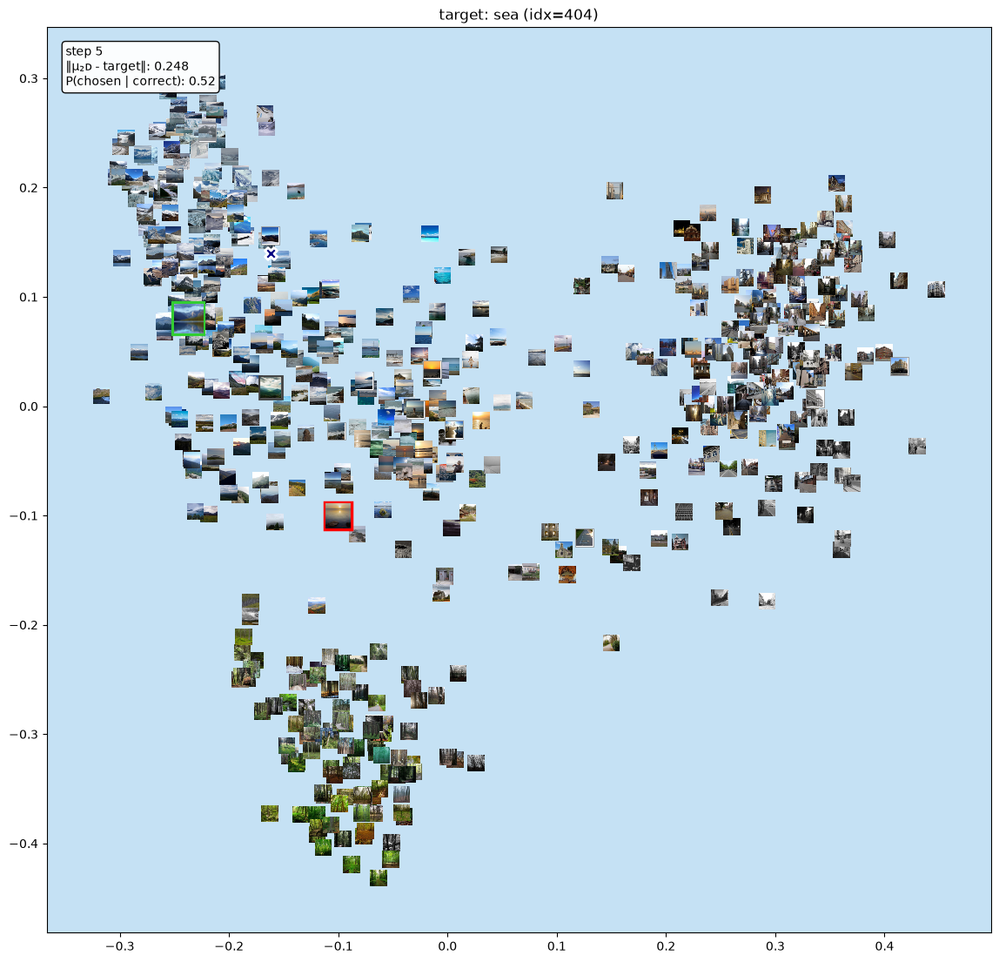

In [8]:
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
from matplotlib.patches import Ellipse, Rectangle

# preload thumbnails once
def load_thumb(path, size=(35, 35)):
    img = Image.open(path).convert("RGB").resize(size, Image.LANCZOS)
    return np.array(img)

print("loading thumbnails...")
thumbs = [load_thumb(p) for p in paths]
print(f"loaded {len(thumbs)} thumbnails")


def plot_step_scenery(ax, step, history, xy_pca, thumbs, target_idx, 
                      pca_P, pca_mean, sigma_eps, X):
    ax.clear()
    mu = history["mu"][step]
    Sigma = history["Sigma"][step]
    queries_so_far = history["queries"][:step]
    current_query = history["queries"][step] if step < len(history["queries"]) else None
    current_answer = history["answers"][step] if step < len(history["answers"]) else None
    
    # project belief
    mu_2d, Sigma_2d = project_belief_to_2d(mu, Sigma, pca_P, pca_mean)
    
    # figure out which items to highlight
    used_prev = set()
    for (i, j) in queries_so_far:
        used_prev.add(i); used_prev.add(j)
    if current_query is not None:
        used_prev.discard(current_query[0])
        used_prev.discard(current_query[1])
    
    chosen_idx, rejected_idx = None, None
    if current_query is not None and current_answer is not None:
        i, j = current_query
        chosen_idx = i if current_answer == 0 else j
        rejected_idx = j if current_answer == 0 else i
    
    # 1σ and 2σ ellipse — behind everything, so you see thumbnails through it
    eigvals, eigvecs = np.linalg.eigh(Sigma_2d)
    angle = np.degrees(np.arctan2(eigvecs[1, -1], eigvecs[0, -1]))
    for n_std, alpha_fill in [(2, 0.10), (1, 0.20)]:
        width, height = 2 * n_std * np.sqrt(np.maximum(eigvals, 1e-12))
        ell = Ellipse(xy=mu_2d, width=width, height=height, angle=angle,
                      facecolor='#3498db', alpha=alpha_fill, edgecolor='#1f4e79',
                      linewidth=1.5, zorder=0)
        ax.add_patch(ell)
    
    # plot all thumbnails
    for k in range(len(thumbs)):
        # decide zoom / border based on role
        if k == target_idx:
            zoom, border_color, border_lw = 0.6, 'red', 2.5
            zorder = 5
        elif k == chosen_idx:
            zoom, border_color, border_lw = 0.7, 'limegreen', 3
            zorder = 4
        elif k == rejected_idx:
            zoom, border_color, border_lw = 0.5, '#404040', 2
            zorder = 4
        elif k in used_prev:
            zoom, border_color, border_lw = 0.4, 'gray', 0.5
            zorder = 2
        else:
            zoom, border_color, border_lw = 0.4, 'none', 0
            zorder = 1
        
        im = OffsetImage(thumbs[k], zoom=zoom)
        pad = 0.05 if border_color != 'none' else 0
        ab = AnnotationBbox(im, (xy_pca[k, 0], xy_pca[k, 1]),
                            frameon=(border_color != 'none'), pad=pad,
                            bboxprops=dict(edgecolor=border_color, linewidth=border_lw)
                            if border_color != 'none' else None)
        ax.add_artist(ab)
        ab.set_zorder(zorder)
    
    # belief mean marker on top
    ax.scatter(mu_2d[0], mu_2d[1], s=100, c='#000080', marker='X',
               edgecolors='white', linewidths=2, zorder=10)
    
    # annotation box
    dist_to_target = np.linalg.norm(mu_2d - xy_pca[target_idx])
    ann_text = f"step {step}\n‖µ₂ᴅ - target‖: {dist_to_target:.3f}"
    if current_query is not None and current_answer is not None:
        i, j = current_query
        p_i = probit_prob(X[i], X[j], X[target_idx], sigma_eps)
        p_chosen = p_i if current_answer == 0 else (1 - p_i)
        ann_text += f"\nP(chosen | correct): {p_chosen:.2f}"
    ax.text(0.02, 0.98, ann_text,
            transform=ax.transAxes, fontsize=10, va='top', ha='left',
            bbox=dict(boxstyle='round,pad=0.3', facecolor='white', alpha=0.95, edgecolor='black'))
    
    # axis limits
    x_min, x_max = xy_pca[:, 0].min(), xy_pca[:, 0].max()
    y_min, y_max = xy_pca[:, 1].min(), xy_pca[:, 1].max()
    margin = 0.05
    ax.set_xlim(x_min - margin, x_max + margin)
    ax.set_ylim(y_min - margin, y_max + margin)
    ax.set_aspect('equal')
    ax.set_title(f"target: {labels[target_idx]} (idx={target_idx})", fontsize=12)


# smoke test — render a single step
fig, ax = plt.subplots(figsize=(14, 14))
plot_step_scenery(ax, step=5, history=history, xy_pca=xy_pca, thumbs=thumbs,
                  target_idx=target_idx, pca_P=pca_P, pca_mean=pca_mean,
                  sigma_eps=SIGMA_EPS, X=X)
plt.show()

rendering all 25 steps...


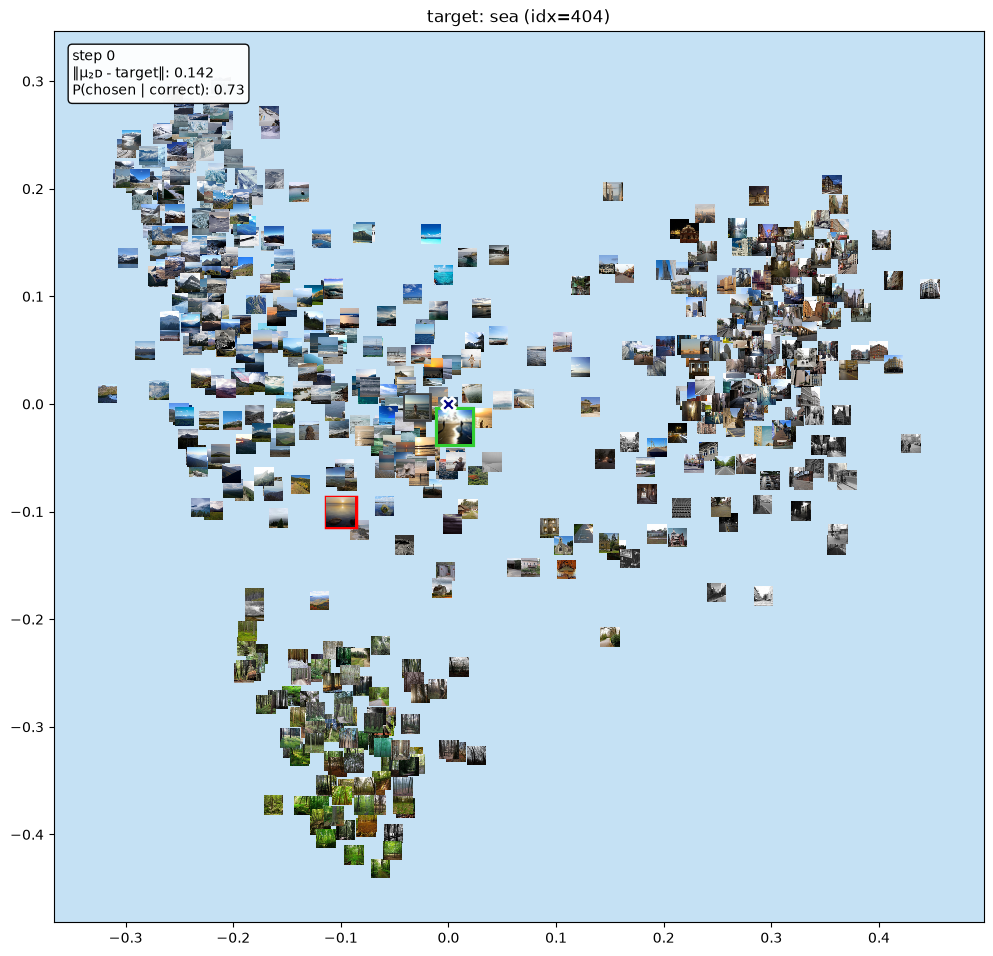

--- end of step 0 ---



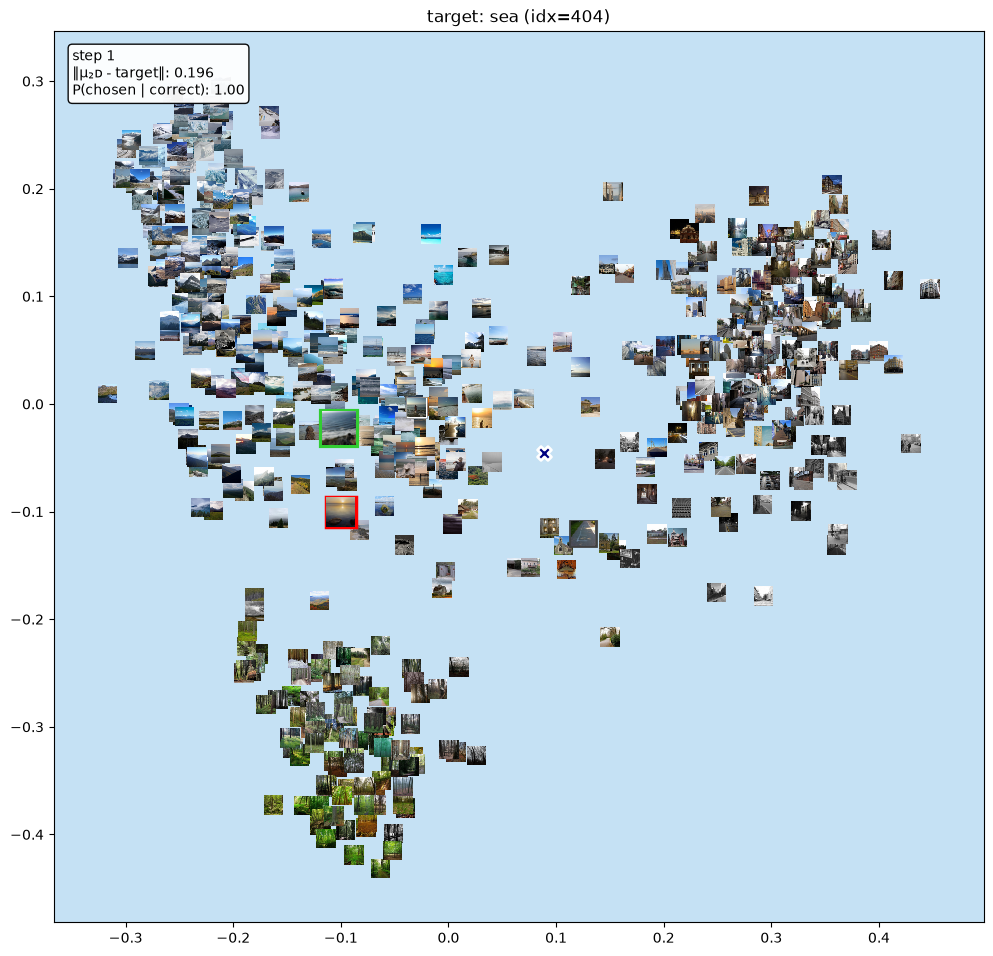

--- end of step 1 ---



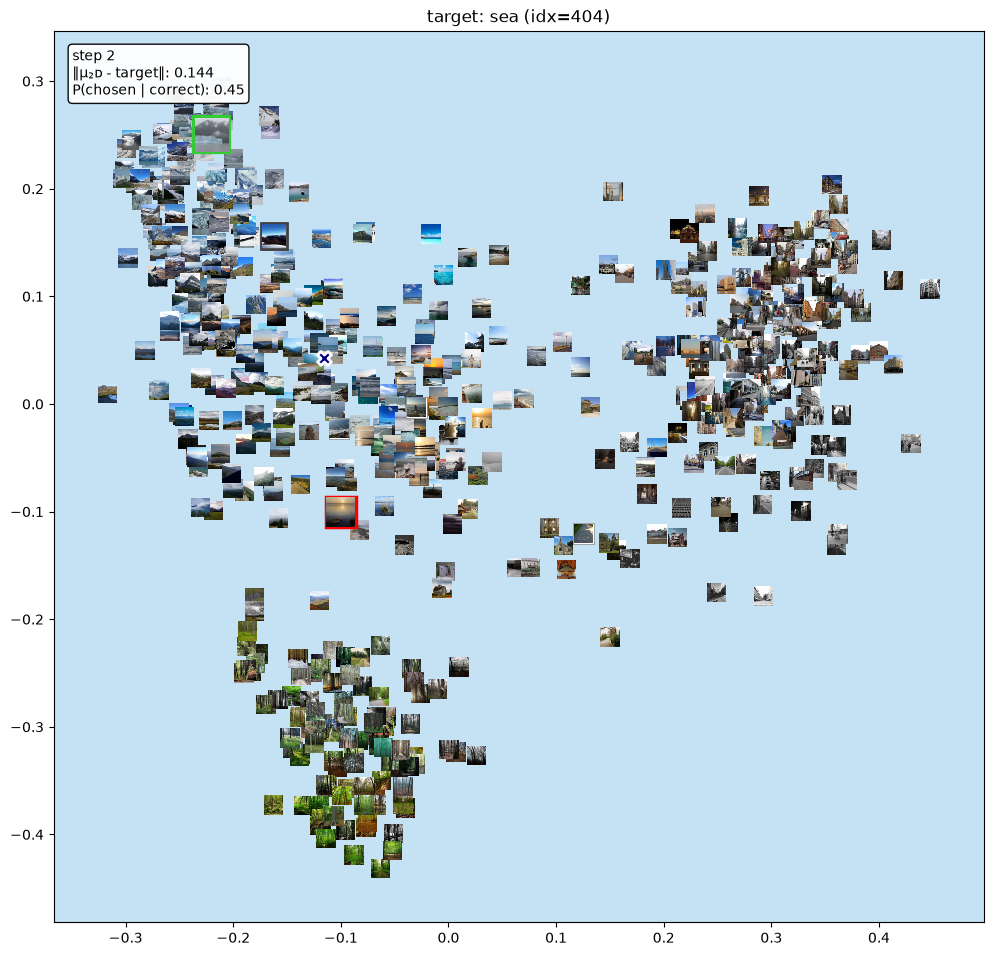

--- end of step 2 ---



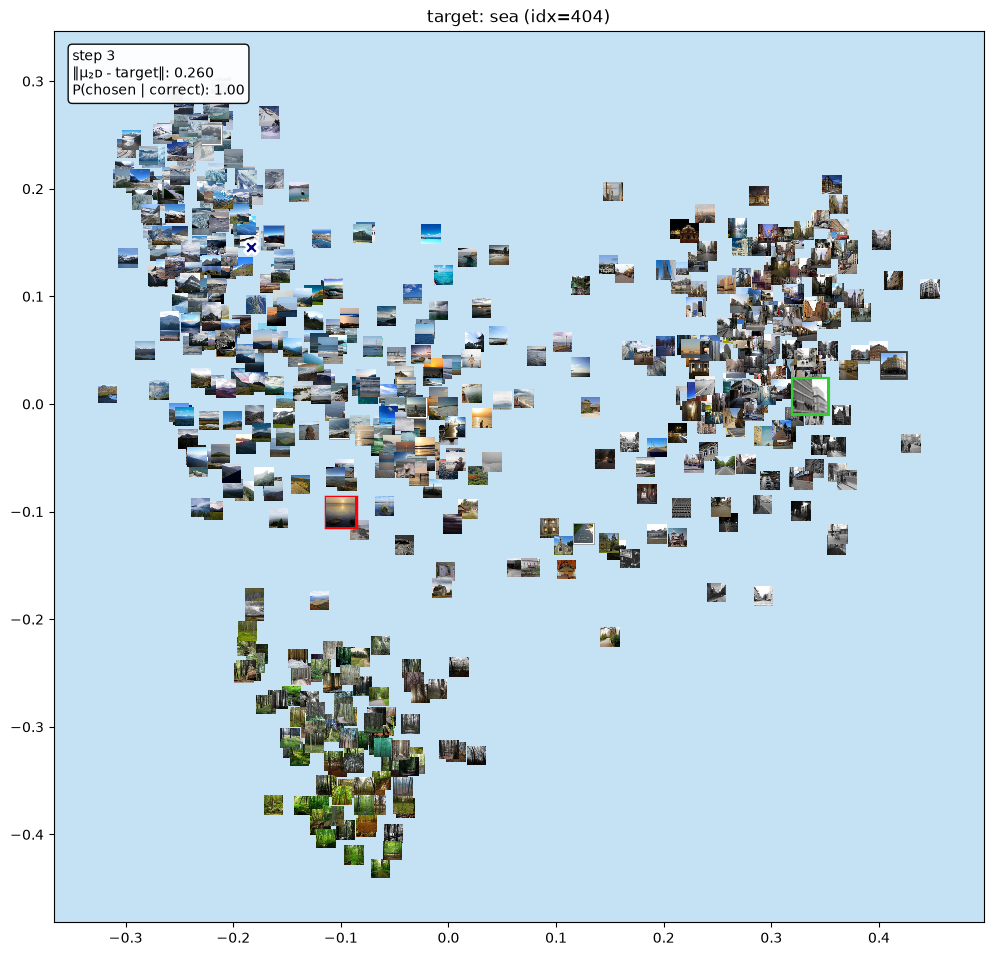

--- end of step 3 ---



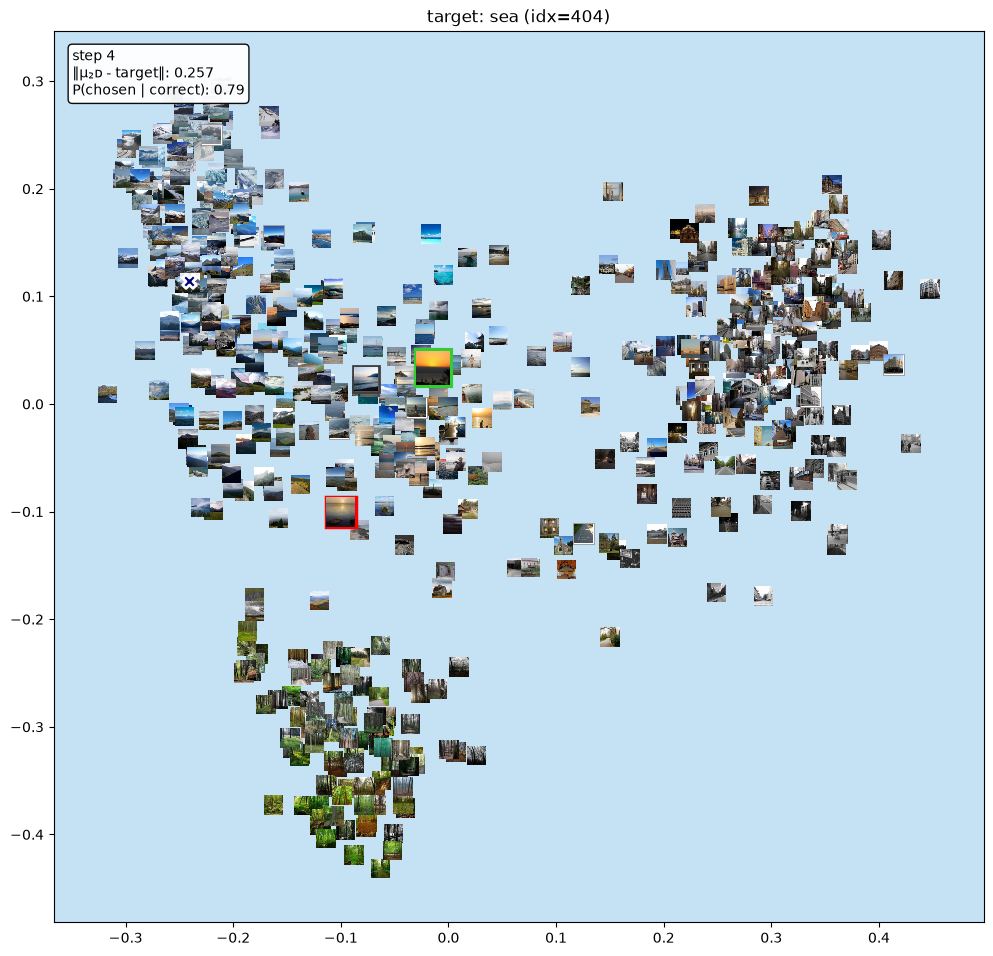

--- end of step 4 ---



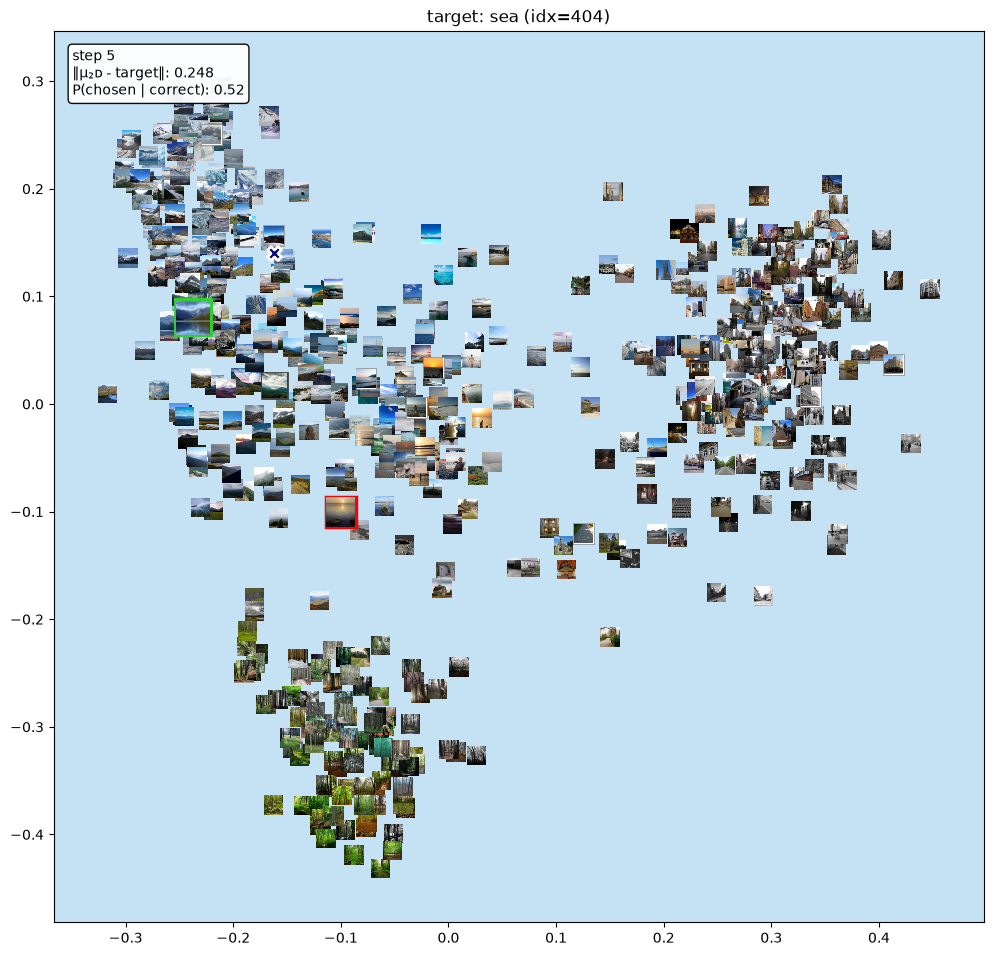

--- end of step 5 ---



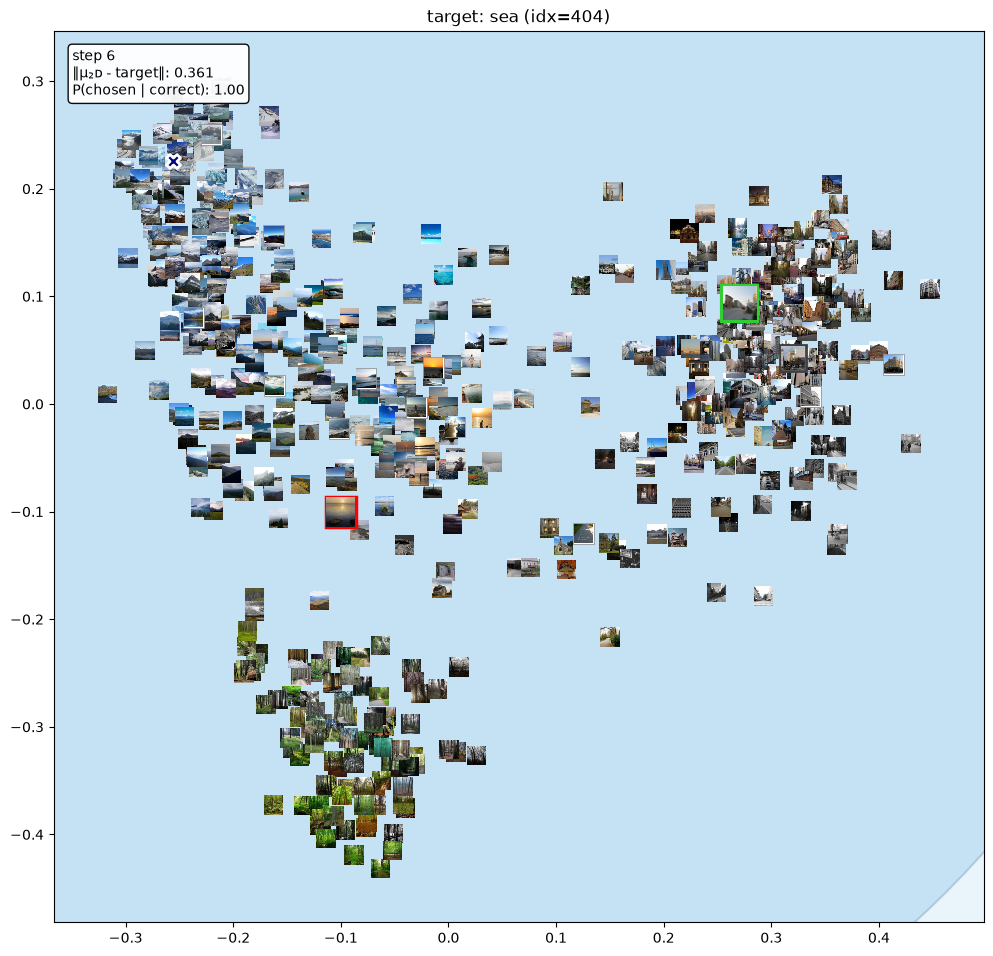

--- end of step 6 ---



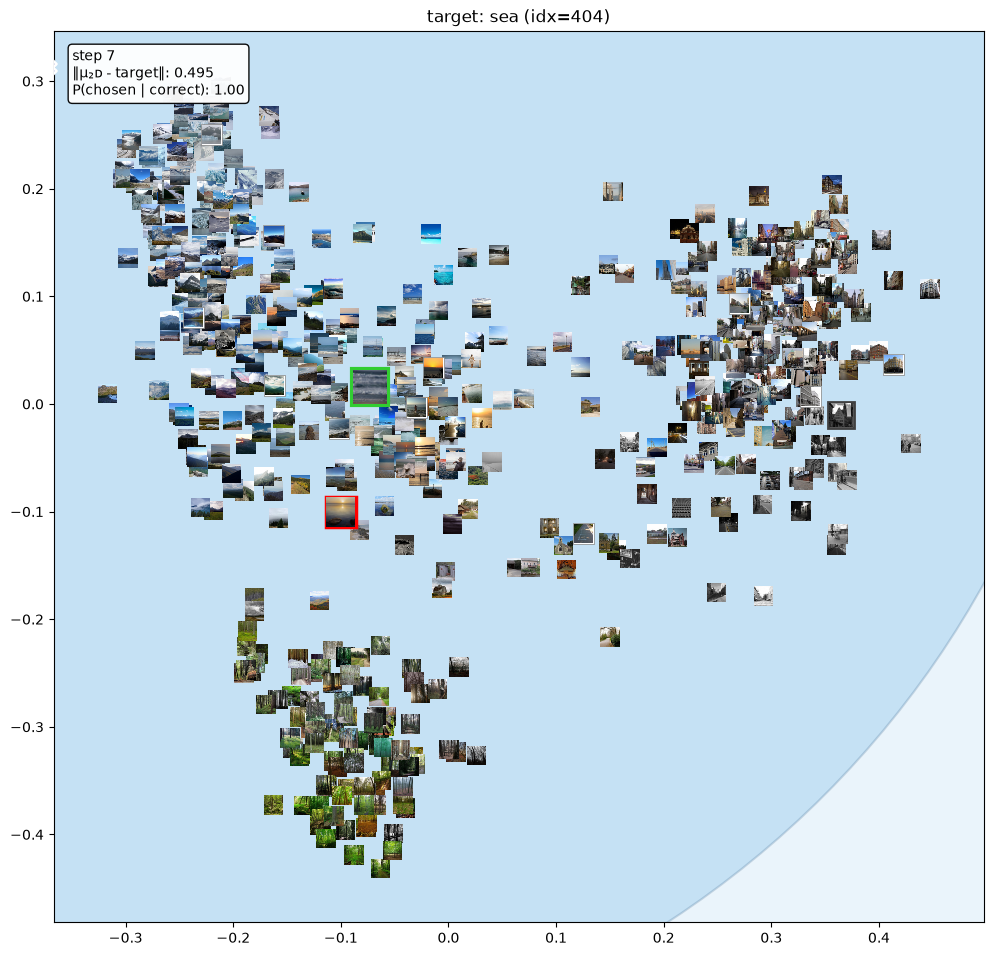

--- end of step 7 ---



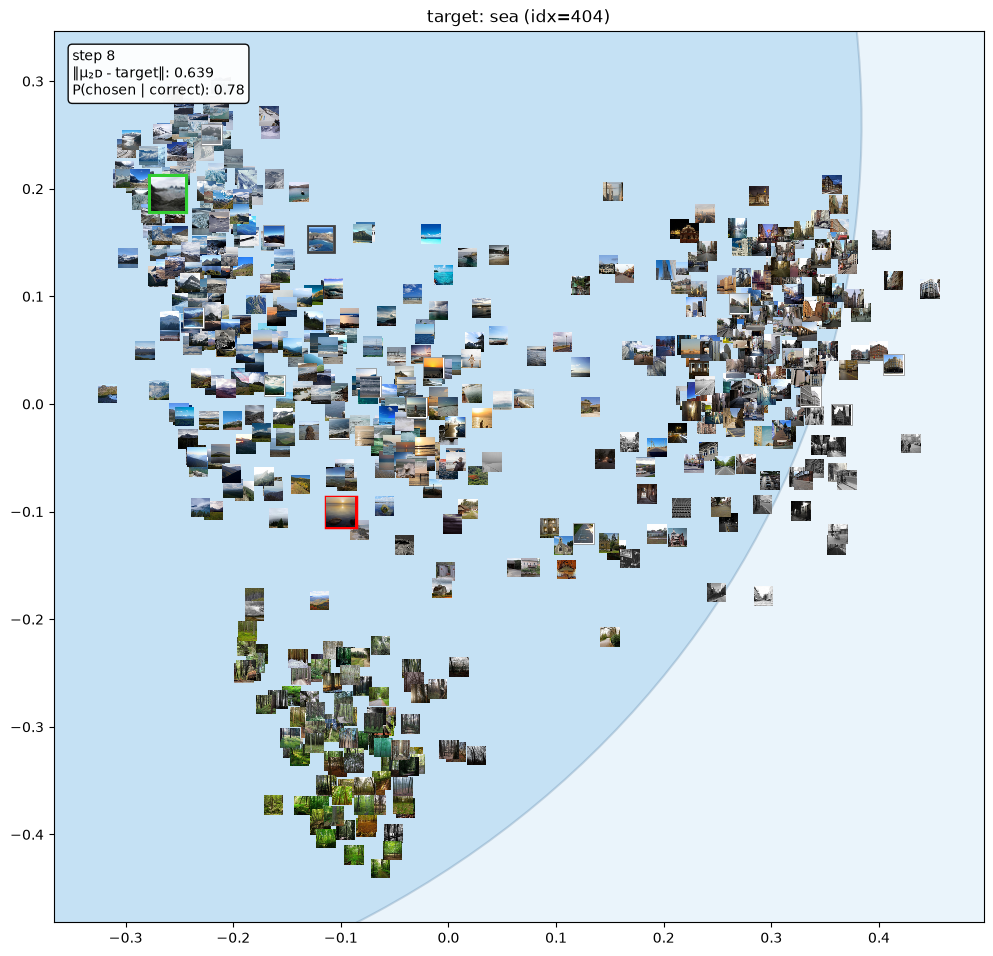

--- end of step 8 ---



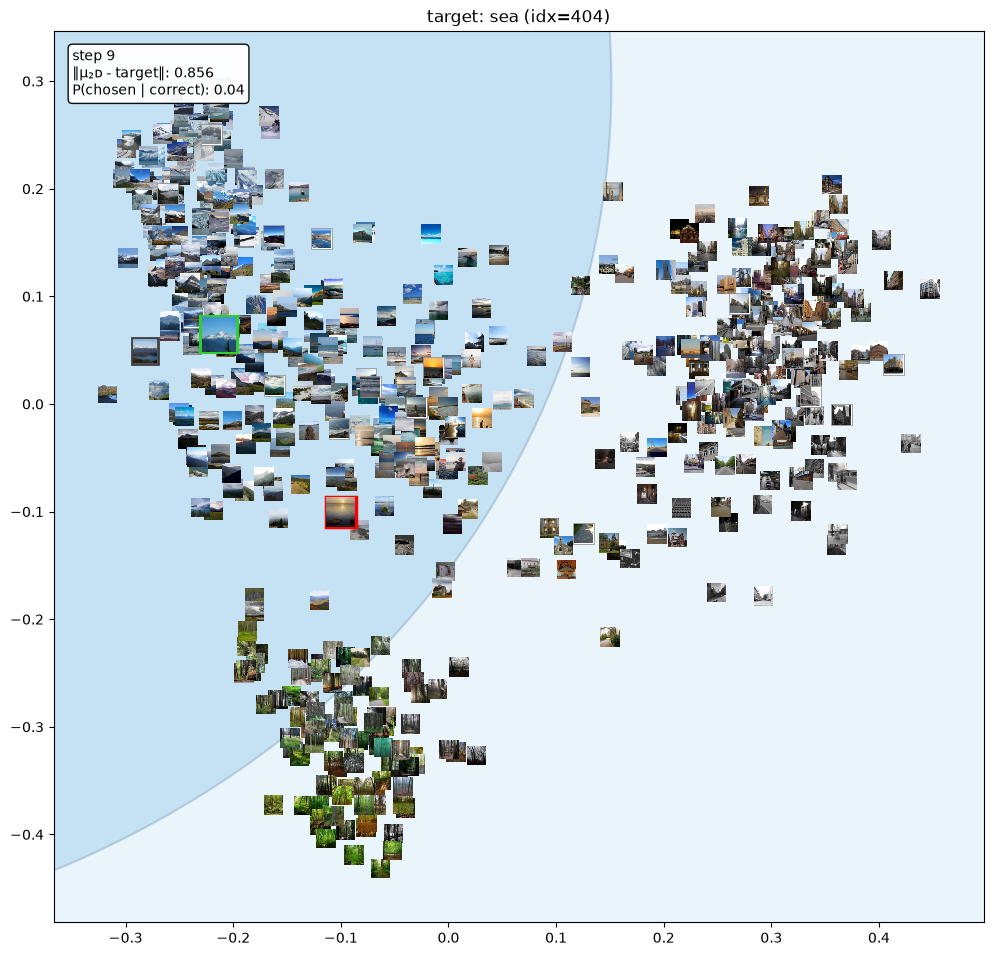

--- end of step 9 ---



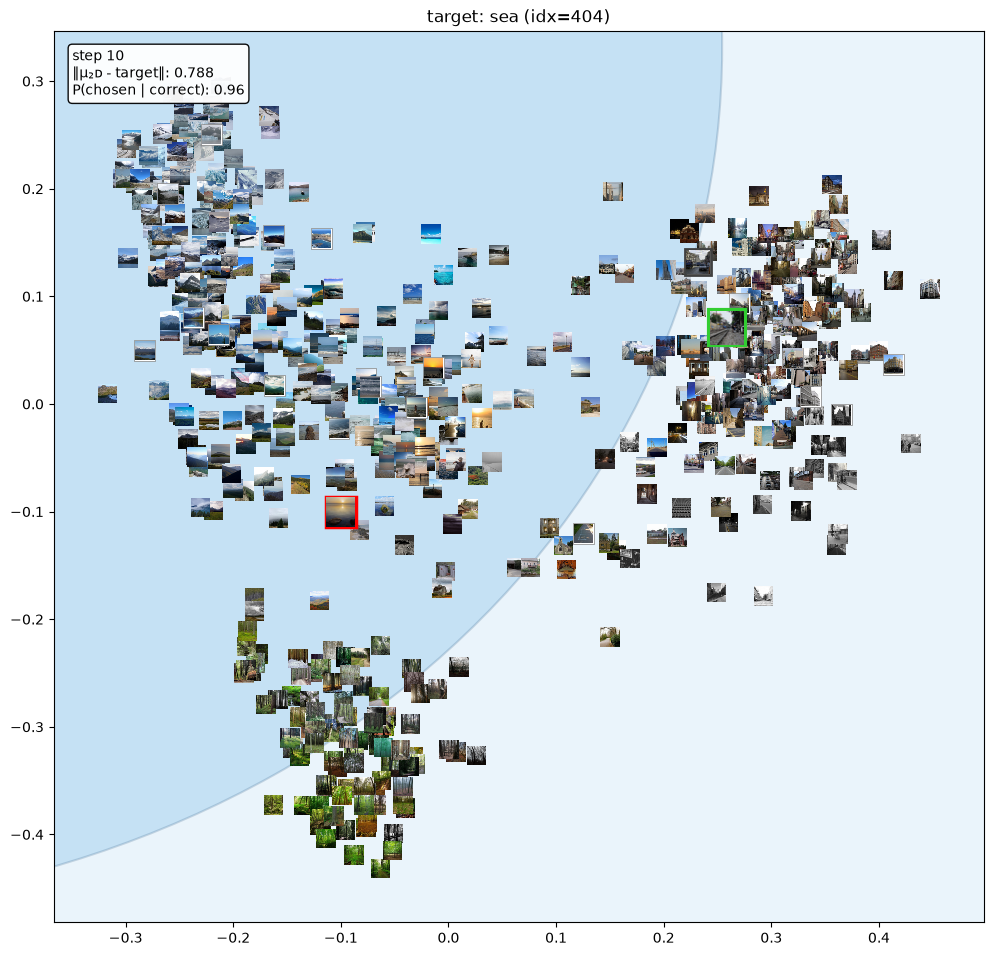

--- end of step 10 ---



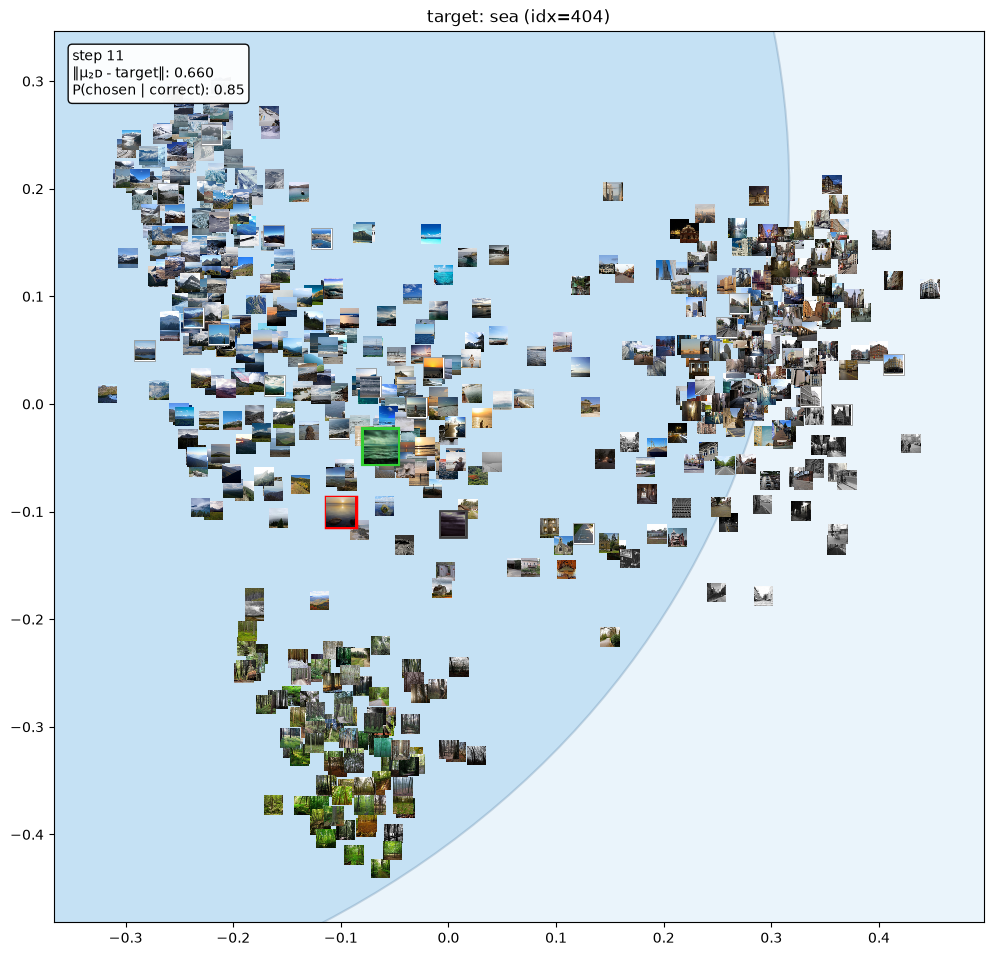

--- end of step 11 ---



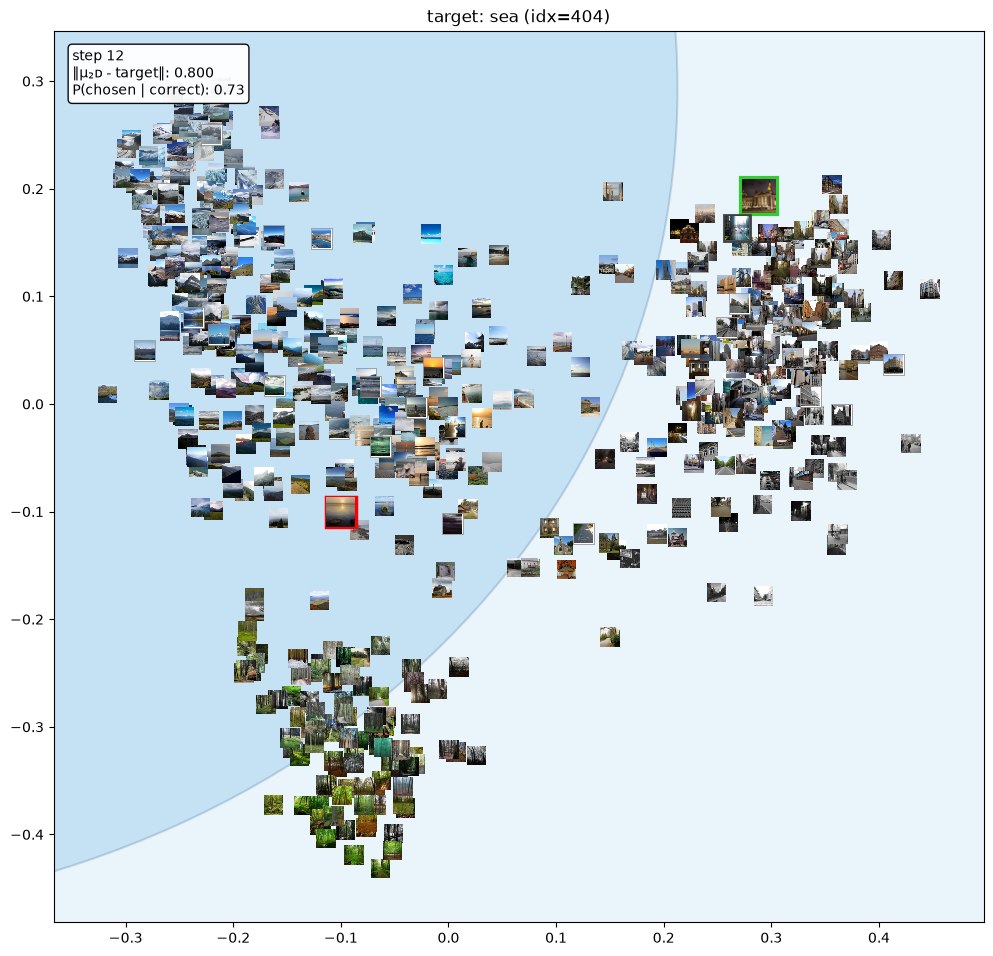

--- end of step 12 ---



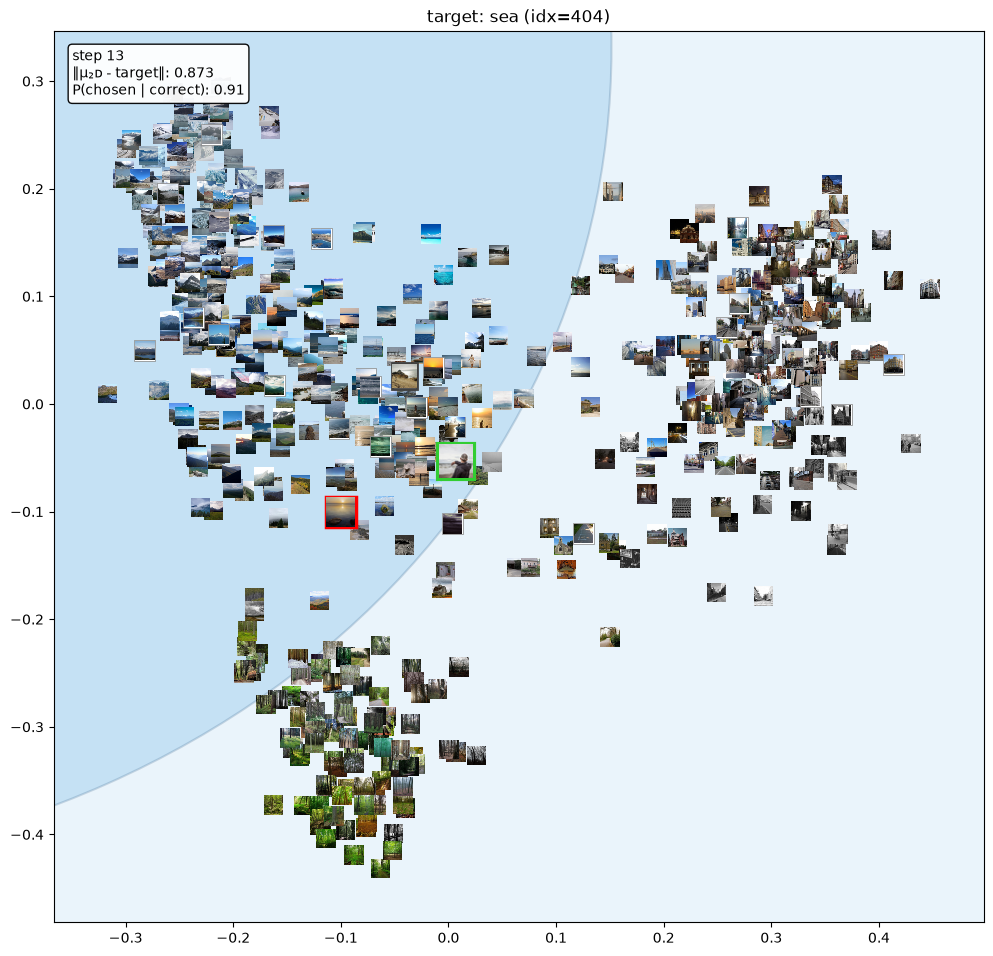

--- end of step 13 ---



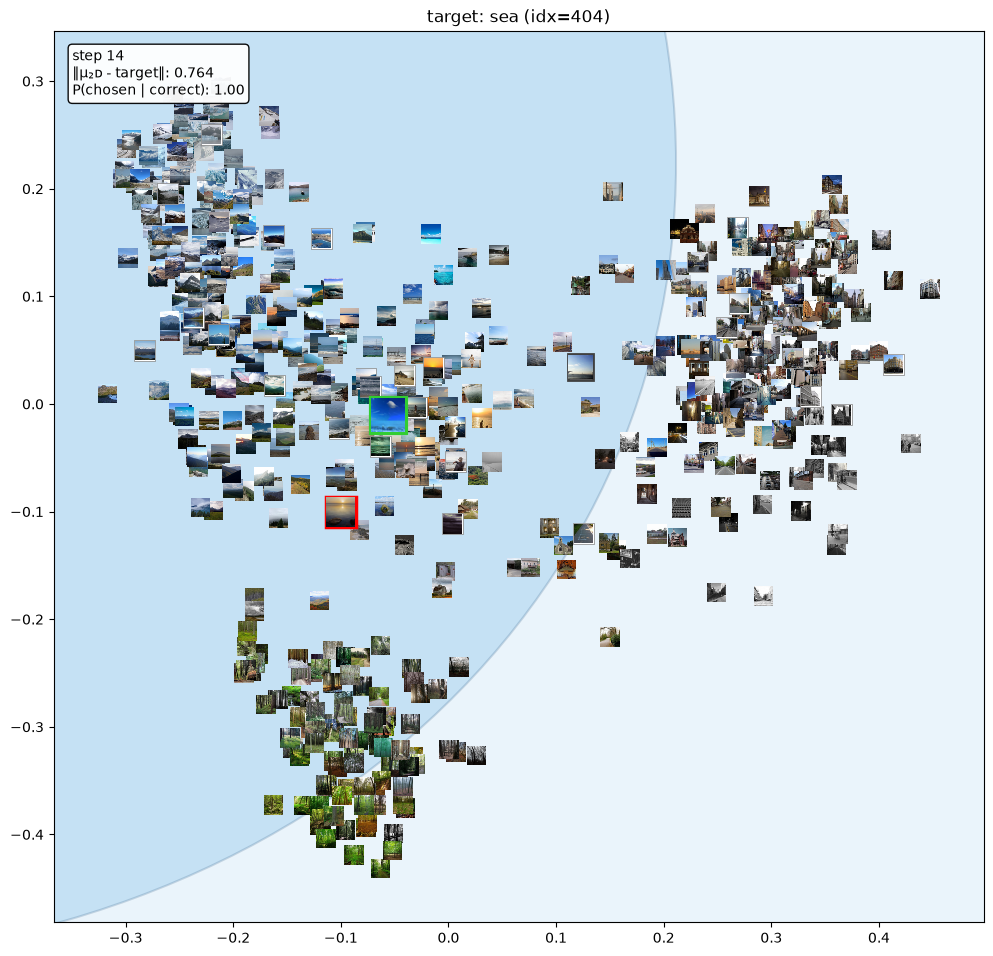

--- end of step 14 ---



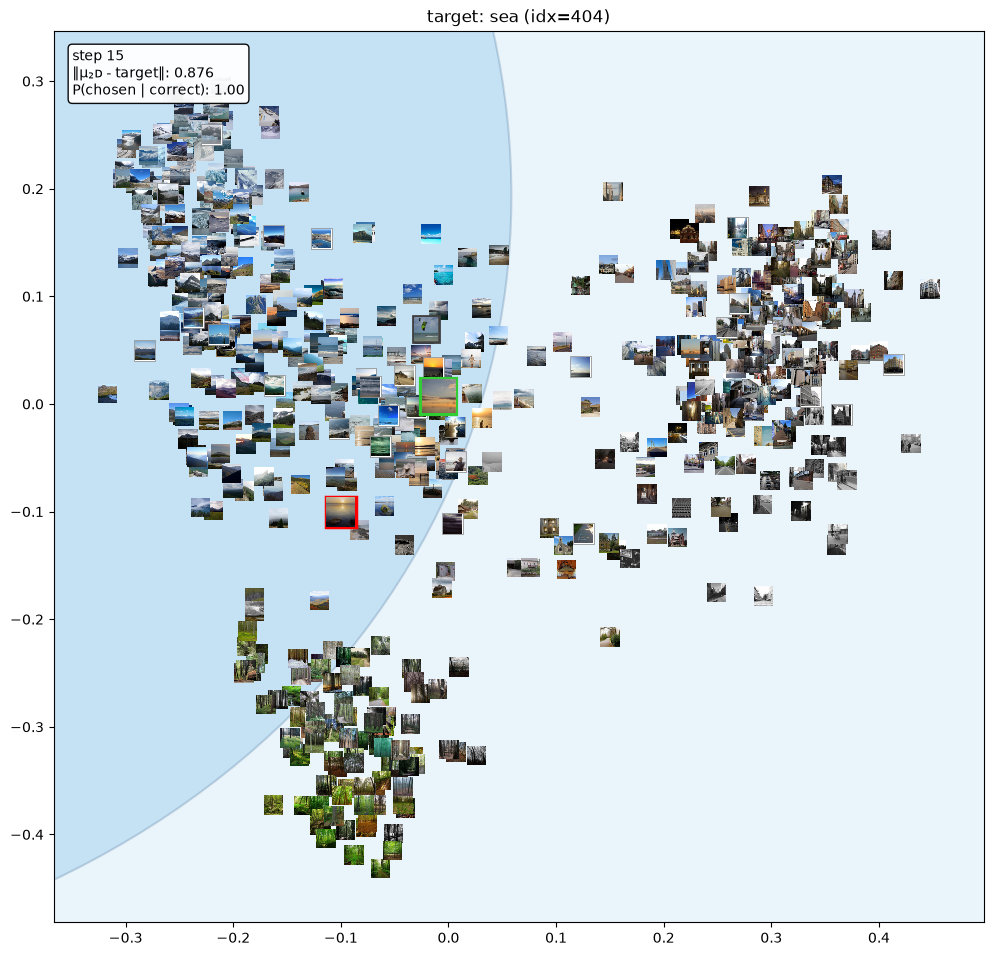

--- end of step 15 ---



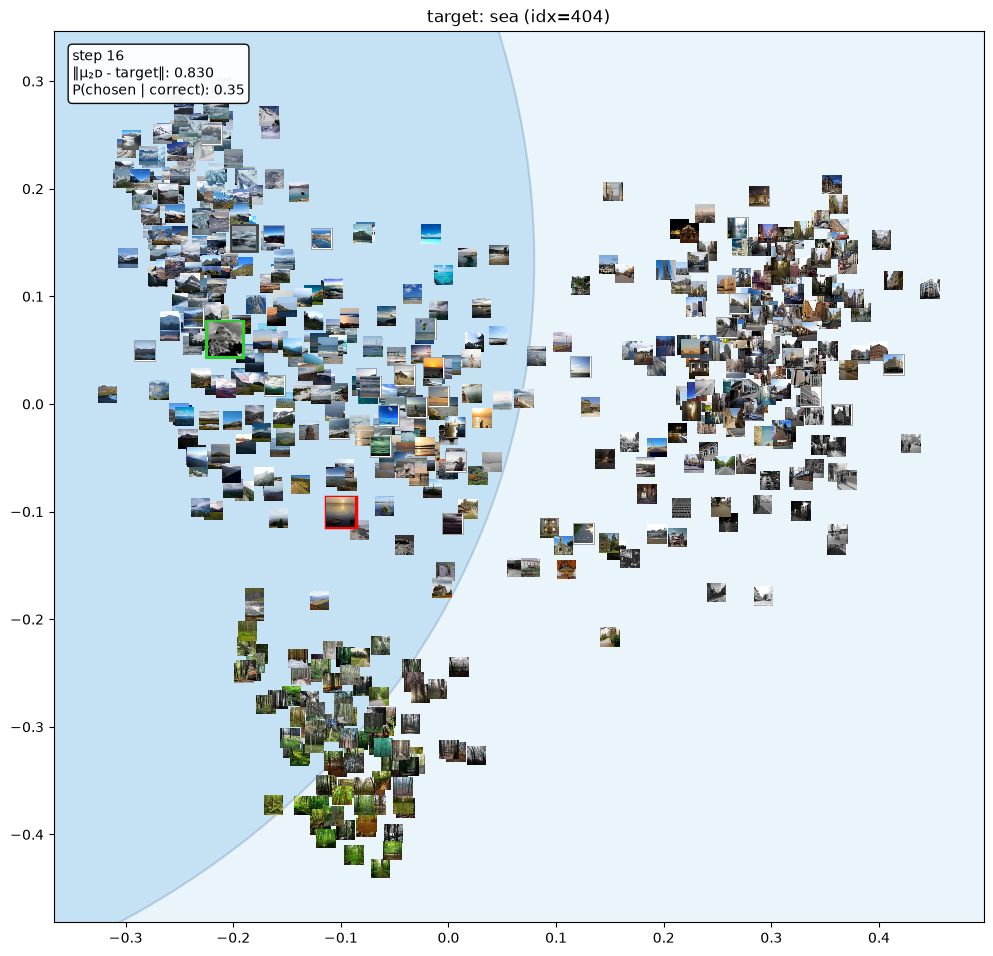

--- end of step 16 ---



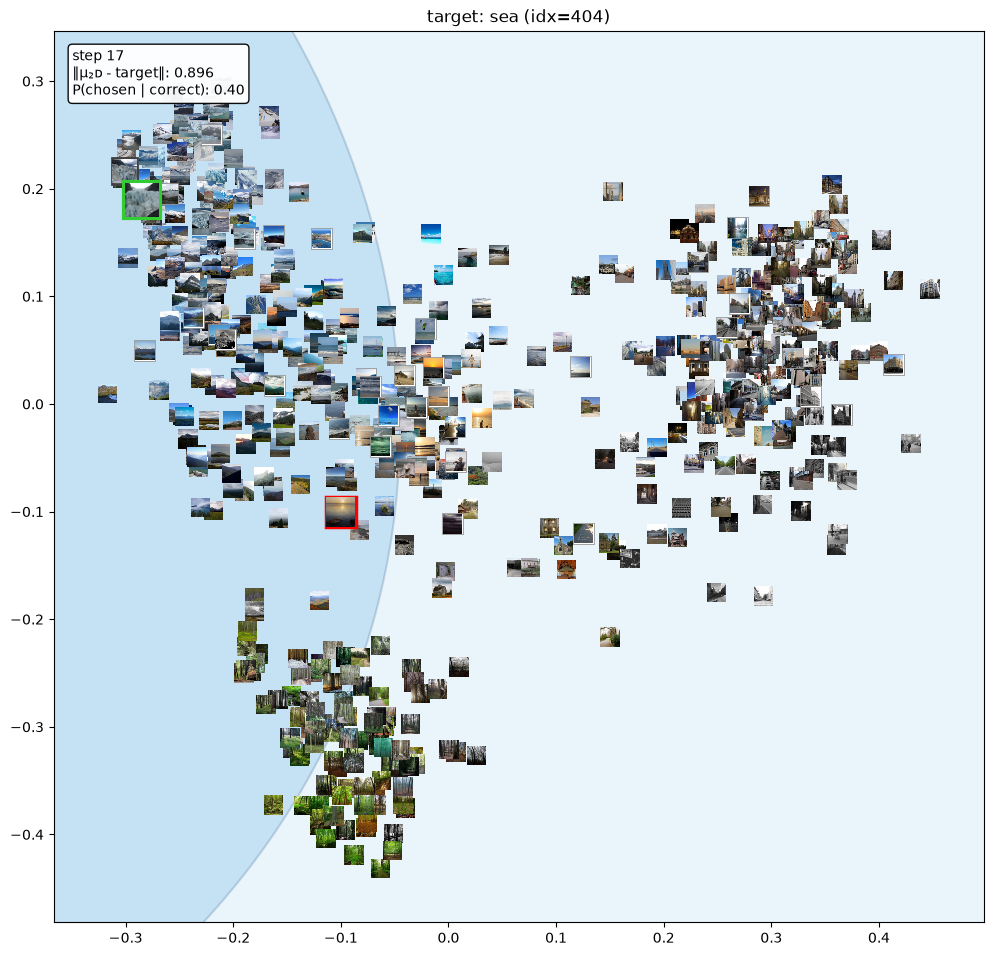

--- end of step 17 ---



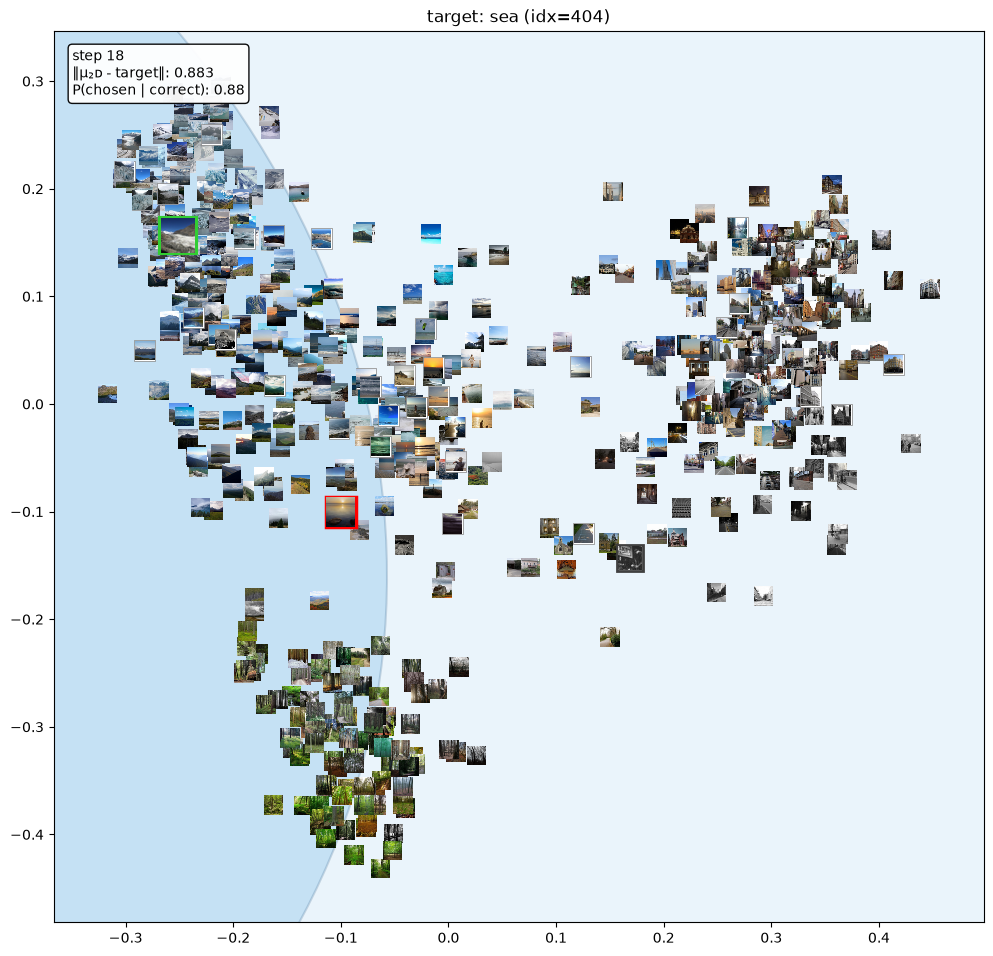

--- end of step 18 ---



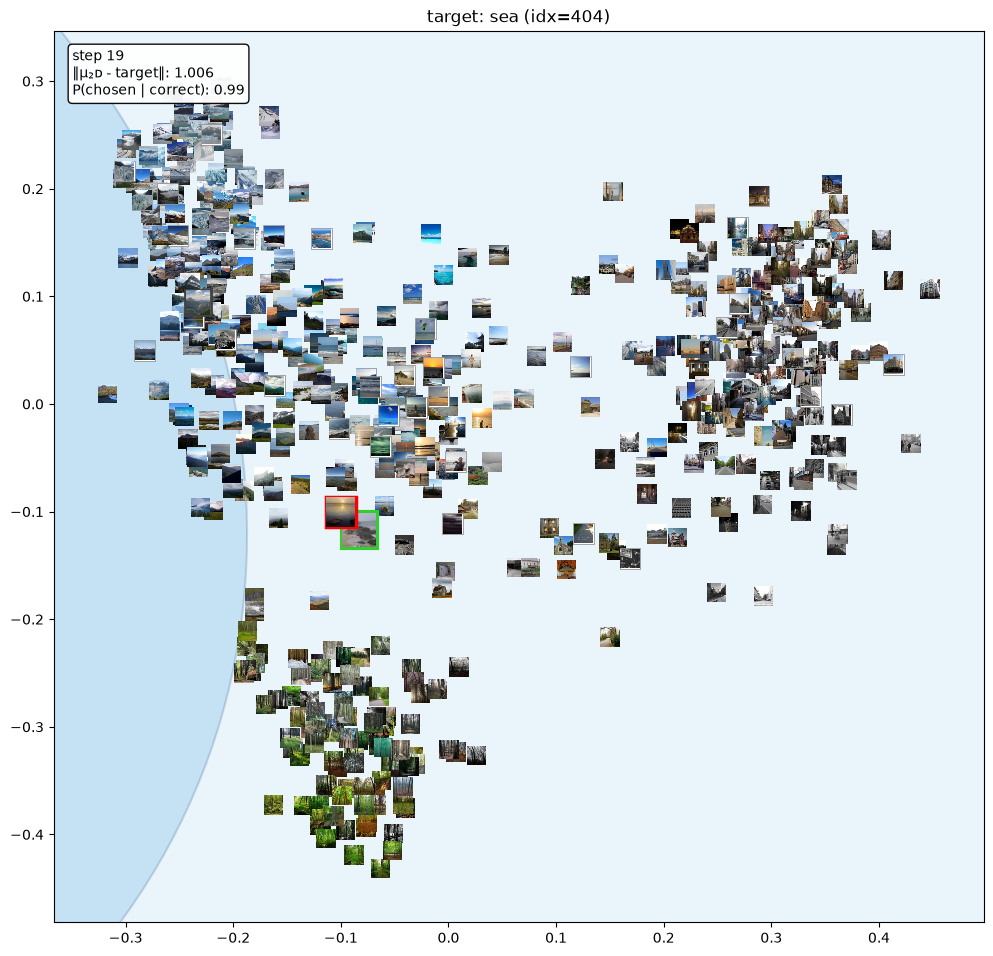

--- end of step 19 ---



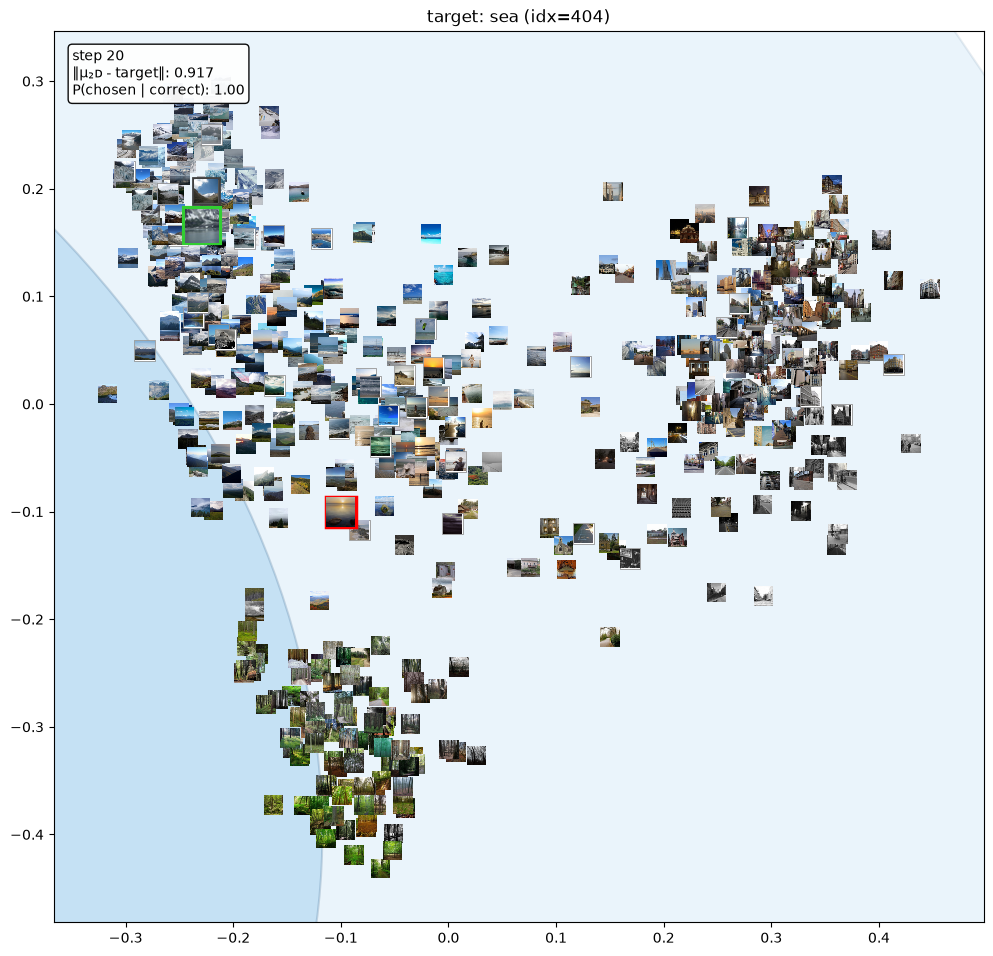

--- end of step 20 ---



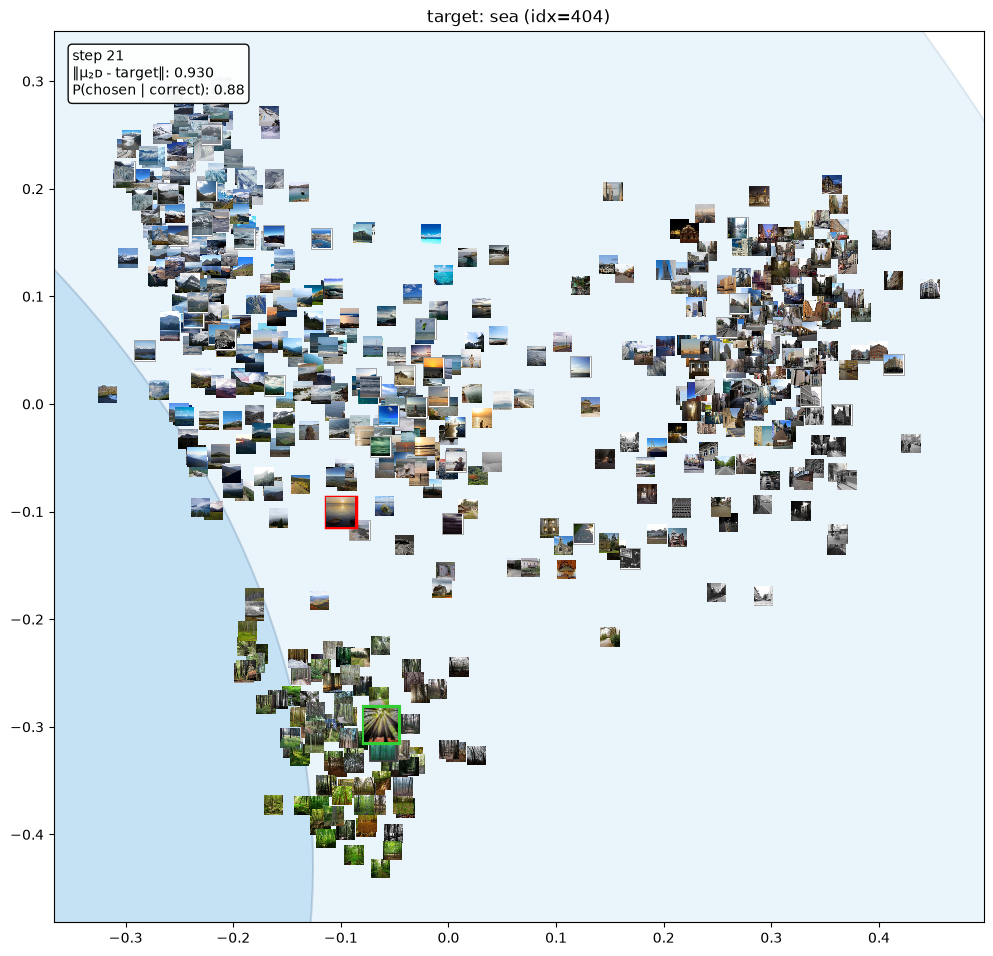

--- end of step 21 ---



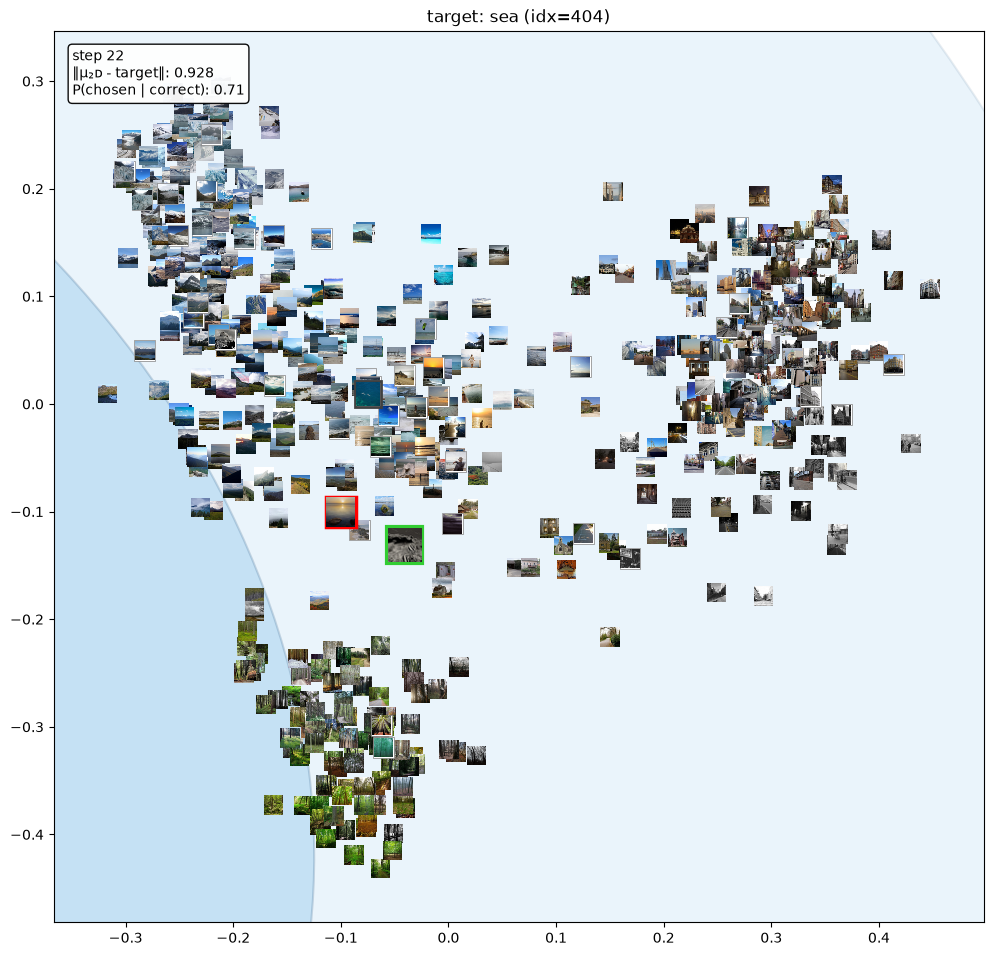

--- end of step 22 ---



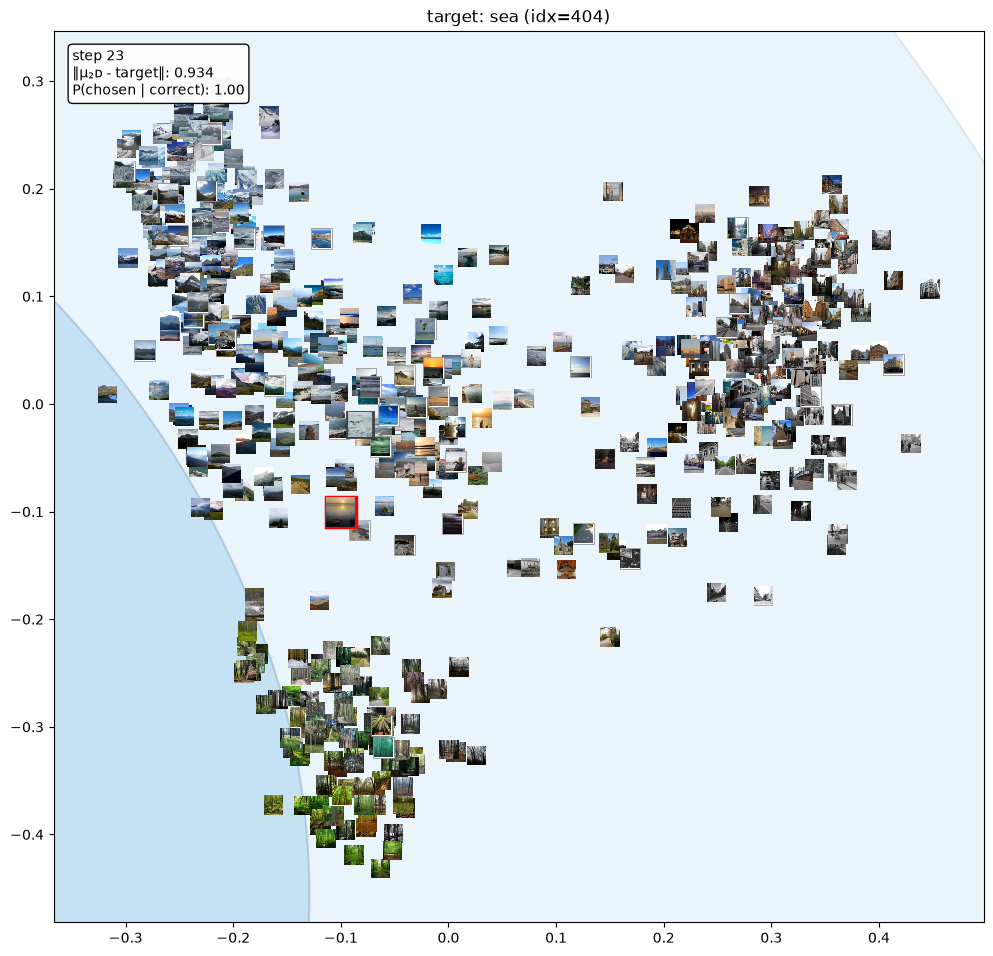

--- end of step 23 ---



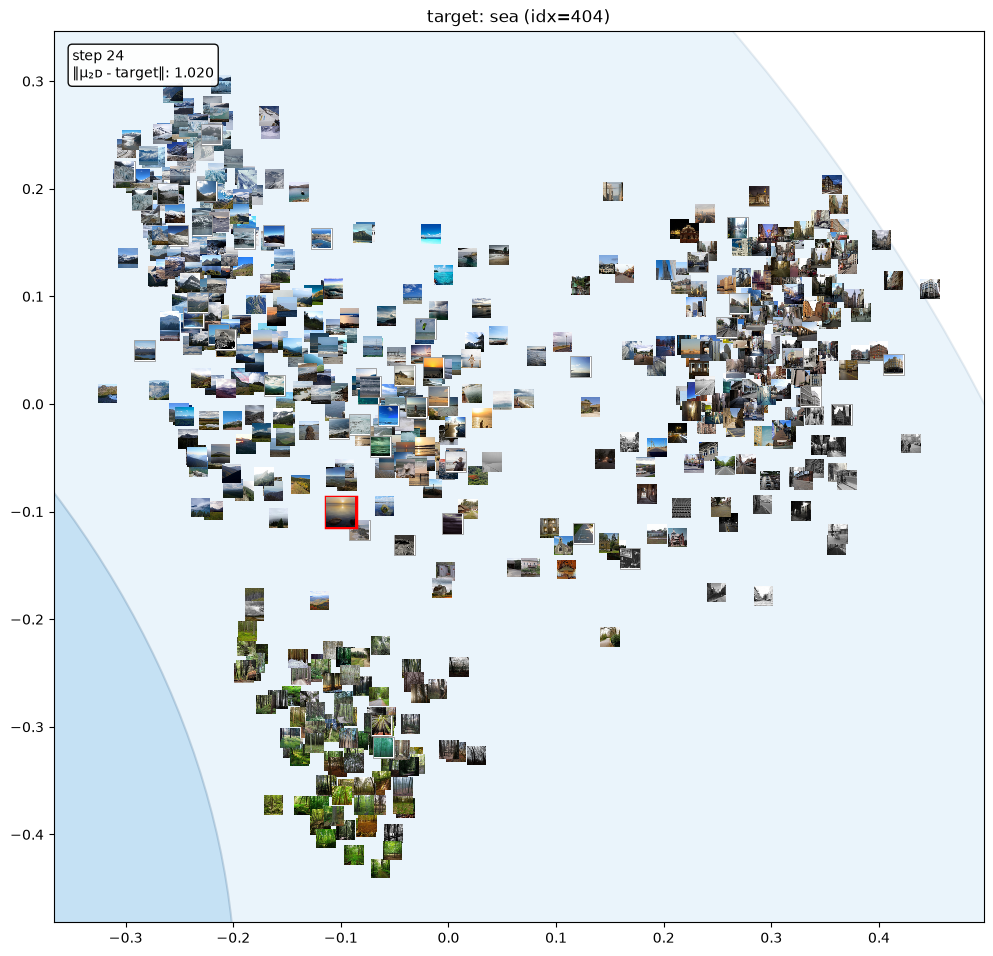

--- end of step 24 ---



In [9]:
n_steps = len(history["mu"])
print(f"rendering all {n_steps} steps...")

for step in range(n_steps):
    fig, ax = plt.subplots(figsize=(12, 12))
    plot_step_scenery(ax, step=step, history=history, xy_pca=xy_pca, thumbs=thumbs,
                      target_idx=target_idx, pca_P=pca_P, pca_mean=pca_mean,
                      sigma_eps=SIGMA_EPS, X=X)
    plt.show()
    print(f"--- end of step {step} ---\n")

In [10]:
print(f"chosen trial: target={target_idx} ({labels[target_idx]}), steps={history['step_stopped']}")
print(f"target 2d position: {xy_pca[target_idx]}")
print()
print(f"{'step':>5}  {'||µ_2d - tgt||':>15}  {'tr(Σ_2d)':>10}  {'tr(Σ_50d)':>10}  {'det(Σ_2d)':>12}")
for step in range(len(history["mu"])):
    mu = history["mu"][step]
    Sigma = history["Sigma"][step]
    mu_2d, Sigma_2d = project_belief_to_2d(mu, Sigma, pca_P, pca_mean)
    dist_2d = np.linalg.norm(mu_2d - xy_pca[target_idx])
    tr_2d = np.trace(Sigma_2d)
    tr_50 = np.trace(Sigma)
    det_2d = np.linalg.det(Sigma_2d)
    print(f"{step:>5}  {dist_2d:>15.4f}  {tr_2d:>10.4f}  {tr_50:>10.4f}  {det_2d:>12.6f}")

chosen trial: target=404 (sea), steps=24
target 2d position: [-0.10001262 -0.10035503]

 step   ||µ_2d - tgt||    tr(Σ_2d)   tr(Σ_50d)     det(Σ_2d)
    0           0.1417      2.0000     50.0000      1.000000
    1           0.1962      1.9898     49.3710      0.989775
    2           0.1441      1.9270     48.7796      0.926979
    3           0.2604      1.9115     48.1474      0.911839
    4           0.2567      1.9044     47.6059      0.905150
    5           0.2481      1.8964     47.0081      0.897527
    6           0.3613      1.8813     46.4021      0.882796
    7           0.4948      1.8607     45.7867      0.862502
    8           0.6393      1.7609     45.2938      0.767128
    9           0.8563      1.7021     44.7319      0.710133
   10           0.7878      1.6840     44.1882      0.693546
   11           0.6603      1.6706     43.5171      0.682545
   12           0.8002      1.6405     42.9918      0.656280
   13           0.8727      1.6370     42.3348      0.6529

In [12]:
print(f"X shape: {X.shape}")
print(f"X per-dim std: {X.std(axis=0).mean():.4f}")
print(f"X per-dim range: {(X.max(axis=0) - X.min(axis=0)).mean():.4f}")
print(f"Norm of typical X row: {np.linalg.norm(X[0]):.4f}")
print(f"Mean pairwise dist between items: "
      f"{np.linalg.norm(X[np.random.default_rng(0).integers(0,n,100)] - X[np.random.default_rng(1).integers(0,n,100)], axis=1).mean():.4f}")
print()
print(f"Prior N(0, I) — dim 50 — expected sample norm: √50 ≈ {np.sqrt(50):.2f}")

X shape: (600, 50)
X per-dim std: 0.0661
X per-dim range: 0.4032
Norm of typical X row: 0.6537
Mean pairwise dist between items: 0.7260

Prior N(0, I) — dim 50 — expected sample norm: √50 ≈ 7.07


In [13]:
# save the original for reference
X_raw = X.copy()

# standardize
X_mean = X.mean(axis=0)
X_std = X.std(axis=0)
X = (X - X_mean) / X_std

print(f"after standardization:")
print(f"  per-dim std: {X.std(axis=0).mean():.4f}")
print(f"  norm of typical row: {np.linalg.norm(X[0]):.4f}")
print(f"  mean pairwise dist: "
      f"{np.linalg.norm(X[np.random.default_rng(0).integers(0,n,100)] - X[np.random.default_rng(1).integers(0,n,100)], axis=1).mean():.4f}")
print(f"  expected under N(0,I) at d=50: {np.sqrt(50):.2f}")

after standardization:
  per-dim std: 1.0000
  norm of typical row: 8.6667
  mean pairwise dist: 9.6845
  expected under N(0,I) at d=50: 7.07


In [19]:
print("\nrecalibrating sigma_eps on standardized X...")
print(f"{'sigma_eps':>10s}  {'flip rate':>10s}")
for sigma in [0.5, 1.0, 2.0, 3.0, 5.0, 10.0, 20.0]:
    fr = measure_flip_rate(X, sigma)
    print(f"{sigma:>10.2f}  {fr:>10.1%}")


recalibrating sigma_eps on standardized X...
 sigma_eps   flip rate
      0.50       10.2%
      1.00       19.1%
      2.00       29.7%
      3.00       35.7%
      5.00       41.2%
     10.00       46.0%
     20.00       49.0%


In [16]:
print(f"target: idx={target_idx} ({labels[target_idx]}) at 2d {xy_pca[target_idx]}")
print()
print(f"{'step':>5}  {'||µ_2d - tgt||':>15}  {'tr(Σ_2d)':>10}  {'tr(Σ_50d)':>10}")
for step in [0, 5, 10, 20, 30, 40, 47]:
    if step >= len(history["mu"]):
        continue
    mu = history["mu"][step]
    Sigma = history["Sigma"][step]
    mu_2d, Sigma_2d = project_belief_to_2d(mu, Sigma, pca_P, pca_mean)
    dist_2d = np.linalg.norm(mu_2d - xy_pca[target_idx])
    tr_2d = np.trace(Sigma_2d)
    tr_50 = np.trace(Sigma)
    print(f"{step:>5}  {dist_2d:>15.4f}  {tr_2d:>10.4f}  {tr_50:>10.4f}")

target: idx=53 (buildings) at 2d [ 0.10667203 -0.13152578]

 step   ||µ_2d - tgt||    tr(Σ_2d)   tr(Σ_50d)
    0           0.1693      2.0000     50.0000
    5           0.2617      1.9646     47.2317
   10           0.1571      1.7908     45.6263
   20           0.6765      1.6278     41.6941
   30           0.5419      1.4729     38.4821
   40           0.3956      1.3315     34.9663
   47           0.2035      1.2054     32.8800


In [17]:
print(f"X mean per-dim (should be ~0): {X.mean(axis=0)[:5]}")
print(f"X std per-dim (should be ~1): {X.std(axis=0)[:5]}")
print(f"X norm per row (should be ~7): {np.linalg.norm(X[0]):.2f}")

X mean per-dim (should be ~0): [ 9.5168751e-08 -6.9538750e-08 -1.7722448e-07 -1.8745661e-07
 -1.2035792e-07]
X std per-dim (should be ~1): [0.9999998 0.9999994 1.        1.0000001 1.0000001]
X norm per row (should be ~7): 8.67


In [18]:
print("Variance in E_work per PCA component (should decrease monotonically):")
print(f"  first 10 dims: {X.std(axis=0)[:10]}")
print(f"  last 10 dims:  {X.std(axis=0)[-10:]}")
print()
# after standardization these will all be 1 — but the ACTUAL information is in the RAW variance
# check the raw eigenvalue spectrum from PCA
raw_variance = X_raw.var(axis=0)  # X_raw was saved before standardization
print(f"Raw PCA variance per component:")
print(f"  first 10: {raw_variance[:10]}")
print(f"  last 10:  {raw_variance[-10:]}")
print(f"  ratio (first / last): {raw_variance[0] / raw_variance[-1]:.1f}x")

Variance in E_work per PCA component (should decrease monotonically):
  first 10 dims: [0.9999998  0.9999994  1.         1.0000001  1.0000001  0.9999997
 1.0000001  0.99999994 1.0000001  1.0000004 ]
  last 10 dims:  [0.9999997  1.0000001  1.0000001  0.9999997  1.         1.0000002
 1.0000005  0.9999997  0.99999994 1.0000002 ]

Raw PCA variance per component:
  first 10: [0.04600837 0.02812223 0.02194109 0.01571249 0.01379752 0.01218002
 0.00986224 0.00885216 0.00768786 0.00730508]
  last 10:  [0.00175135 0.00166982 0.0016503  0.00153138 0.00151475 0.00147811
 0.00142419 0.00142105 0.00140164 0.00135022]
  ratio (first / last): 34.1x


In [20]:
data = np.load(DATA / "scenery_embedding.npz", allow_pickle=True)
E_work_check = data["E_work"]
print(f"E_work shape: {E_work_check.shape}")
print(f"expected: (600, 10)")

E_work shape: (600, 10)
expected: (600, 10)


In [4]:
print(f"X stats (D_work=10, unstandardized):")
print(f"  shape: {X.shape}")
print(f"  norm of typical row: {np.linalg.norm(X[0]):.4f}")
print(f"  mean pairwise dist: "
      f"{np.linalg.norm(X[np.random.default_rng(0).integers(0,n,100)] - X[np.random.default_rng(1).integers(0,n,100)], axis=1).mean():.4f}")
print(f"  expected under N(0,I) at d=10: {np.sqrt(10):.2f}")
print()
print("recalibrating sigma_eps...")
print(f"{'sigma_eps':>10s}  {'flip rate':>10s}")
for sigma in [0.01, 0.02, 0.05, 0.10, 0.20, 0.50, 1.0]:
    fr = measure_flip_rate(X, sigma)
    print(f"{sigma:>10.2f}  {fr:>10.1%}")

X stats (D_work=10, unstandardized):
  shape: (600, 10)
  norm of typical row: 0.5247
  mean pairwise dist: 0.5628
  expected under N(0,I) at d=10: 3.16

recalibrating sigma_eps...
 sigma_eps   flip rate


NameError: name 'measure_flip_rate' is not defined

In [11]:
print(f"{'step':>5}  {'||µ_2d - tgt||':>15}  {'tr(Σ_2d)':>10}  {'tr(Σ_10d)':>10}")
for step in range(len(history["mu"])):
    mu = history["mu"][step]
    Sigma = history["Sigma"][step]
    mu_2d, Sigma_2d = project_belief_to_2d(mu, Sigma, pca_P, pca_mean)
    dist_2d = np.linalg.norm(mu_2d - xy_pca[target_idx])
    tr_2d = np.trace(Sigma_2d)
    tr_10 = np.trace(Sigma)
    print(f"{step:>5}  {dist_2d:>15.4f}  {tr_2d:>10.4f}  {tr_10:>10.4f}")

 step   ||µ_2d - tgt||    tr(Σ_2d)   tr(Σ_10d)
    0           0.3138      2.0000     10.0000
    1           0.4445      1.8386      9.3923
    2           0.0376      1.6350      8.7490
    3           0.1650      1.6153      8.0967
    4           0.7497      1.2211      7.4836
    5           0.8482      1.2022      6.8737
    6           0.8438      1.2011      6.2615
    7           1.0775      1.0968      5.7992
    8           0.9761      1.0311      5.3341
    9           0.9973      1.0267      4.7620
   10           1.1007      0.7910      4.4045
   11           1.1704      0.7192      4.2927
   12           1.1945      0.6891      4.1026
   13           1.2980      0.6720      3.8454
   14           1.3535      0.6158      3.6190
   15           1.3201      0.5527      3.2444
   16           1.1358      0.5142      2.8965
   17           1.1886      0.4983      2.7257
   18           1.2303      0.4174      2.4251
   19           1.3813      0.3568      2.2180
   20        

In [12]:
SIGMA_EPS = 0.05

rng = np.random.default_rng(seed=42)
target_idx = int(rng.integers(0, n))
history = gauss_search_verbose(X, target_idx, SIGMA_EPS, max_queries=100,
                                rng=rng, stop_on="argmax")

print(f"target: idx={target_idx}, class={labels[target_idx]}")
print(f"steps taken: {history['step_stopped']}")
print(f"len(history['mu']): {len(history['mu'])}")
print(f"len(history['queries']): {len(history['queries'])}")
print()

print(f"{'step':>5}  {'||µ_2d - tgt||':>15}  {'tr(Σ_2d)':>10}  {'tr(Σ_10d)':>10}")
for step in range(len(history["mu"])):
    mu = history["mu"][step]
    Sigma = history["Sigma"][step]
    mu_2d, Sigma_2d = project_belief_to_2d(mu, Sigma, pca_P, pca_mean)
    dist_2d = np.linalg.norm(mu_2d - xy_pca[target_idx])
    tr_2d = np.trace(Sigma_2d)
    tr_10 = np.trace(Sigma)
    print(f"{step:>5}  {dist_2d:>15.4f}  {tr_2d:>10.4f}  {tr_10:>10.4f}")

print()
print("class trace:")
for k, (i, j) in enumerate(history["queries"]):
    ans = history["answers"][k]
    chosen_cls = labels[i] if ans == 0 else labels[j]
    print(f"  step {k}: ({labels[i]:9s}, {labels[j]:9s}) -> chose {chosen_cls}")

target: idx=53, class=buildings
steps taken: 8
len(history['mu']): 9
len(history['queries']): 8

 step   ||µ_2d - tgt||    tr(Σ_2d)   tr(Σ_10d)
    0           0.1693      2.0000     10.0000
    1           0.2030      1.8386      9.3923
    2           0.4825      1.6866      8.8058
    3           0.6210      1.6714      8.1294
    4           0.4694      1.5793      7.7315
    5           0.7356      1.4797      7.1380
    6           0.8862      1.2630      6.4924
    7           0.7929      1.2345      6.0745
    8           0.8358      1.1521      5.7063

class trace:
  step 0: (glacier  , glacier  ) -> chose glacier
  step 1: (buildings, sea      ) -> chose buildings
  step 2: (buildings, buildings) -> chose buildings
  step 3: (street   , street   ) -> chose street
  step 4: (buildings, buildings) -> chose buildings
  step 5: (street   , street   ) -> chose street
  step 6: (buildings, buildings) -> chose buildings
  step 7: (buildings, buildings) -> chose buildings
